<a href="https://colab.research.google.com/github/OGhub/AIFFEL_quest_cr/blob/master/Exploration/Ex04/Exploration04_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import glob
import imageio

# TensorFlow 및 imageio 버전 확인
print("TensorFlow version:", tf.__version__)
print("imageio version:", imageio.__version__)

# 작업 디렉토리 생성
base_dir = "/content/dcgan_lowres_cifar10"
os.makedirs(f"{base_dir}/generated_samples", exist_ok=True)
os.makedirs(f"{base_dir}/training_checkpoints", exist_ok=True)
os.makedirs(f"{base_dir}/training_history", exist_ok=True)
print("Directories created.")


TensorFlow version: 2.17.1
imageio version: 2.36.0
Directories created.


In [2]:
from tensorflow.keras.datasets import cifar10

# CIFAR-10 데이터 로드
(train_x, _), (test_x, _) = cifar10.load_data()

# 데이터 크기 조정: 16x16 해상도로 다운샘플링
def preprocess_images(images, target_size=(16, 16)):
    resized_images = tf.image.resize(images, target_size)
    resized_images = (resized_images - 127.5) / 127.5  # Normalize to [-1, 1]
    return resized_images

train_x_resized = preprocess_images(train_x)
print(f"Resized images shape: {train_x_resized.shape}")

# tf.data로 데이터셋 구성
BATCH_SIZE = 128
BUFFER_SIZE = 50000
train_dataset = tf.data.Dataset.from_tensor_slices(train_x_resized).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Resized images shape: (50000, 16, 16, 3)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


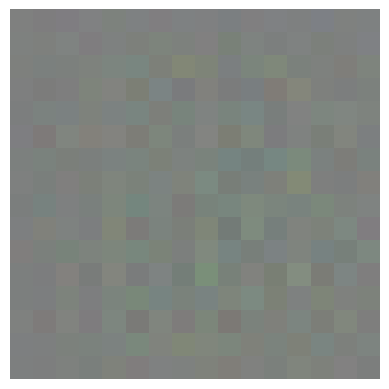

In [3]:
def make_generator_model_lowres():
    model = tf.keras.Sequential([
        layers.Dense(4 * 4 * 256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Reshape((4, 4, 256)),
        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation='tanh'),
    ])
    return model

generator = make_generator_model_lowres()

# 생성자 테스트
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow((generated_image[0] * 127.5 + 127.5).numpy().astype(np.uint8))
plt.axis('off')
plt.show()


In [4]:
def make_discriminator_model_lowres():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=(16, 16, 3)),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(1),
    ])
    return model

discriminator = make_discriminator_model_lowres()

# 판별자 테스트
decision = discriminator(generated_image)
print(f"Discriminator decision: {decision}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Discriminator decision: [[0.01216803]]


In [5]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# 생성자 손실
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# 판별자 손실
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

# 최적화 함수
generator_optimizer = tf.keras.optimizers.Adam(1e-3)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-3)


In [8]:
EPOCHS = 300
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

# 훈련 스텝
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss

# 이미지 저장 함수
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        plt.axis('off')

    plt.savefig(f"{base_dir}/generated_samples/image_at_epoch_{epoch:04d}.png")
    plt.show()

# 훈련 루프
def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)

        generate_and_save_images(generator, epoch + 1, seed)
        print(f"Epoch {epoch + 1}, Gen Loss: {gen_loss}, Disc Loss: {disc_loss}, Time: {time.time() - start}")

        # Checkpoint 저장
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# Checkpoint 설정
checkpoint_dir = f"{base_dir}/training_checkpoints"
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


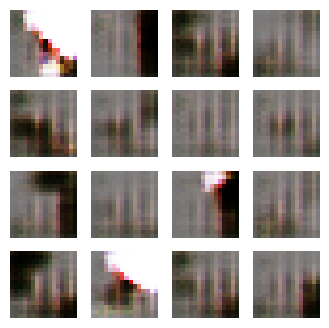

Epoch 1, Gen Loss: 4.97006893157959, Disc Loss: 0.16567711532115936, Time: 10.402244329452515


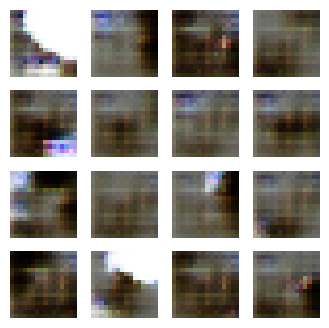

Epoch 2, Gen Loss: 4.689831256866455, Disc Loss: 0.5004803538322449, Time: 6.744970083236694


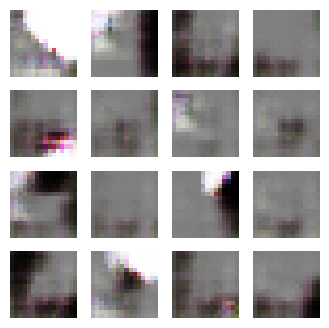

Epoch 3, Gen Loss: 3.667452573776245, Disc Loss: 0.5887165069580078, Time: 6.418919086456299


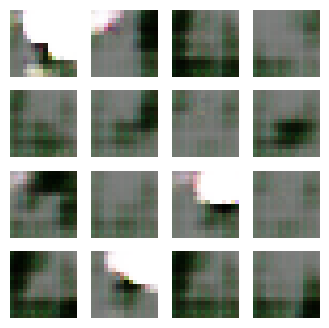

Epoch 4, Gen Loss: 5.80912971496582, Disc Loss: 0.5547769665718079, Time: 6.4351091384887695


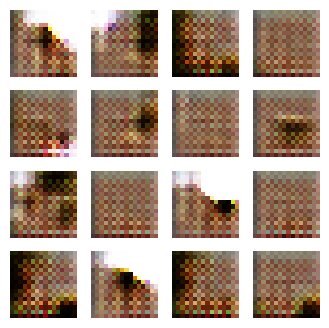

Epoch 5, Gen Loss: 12.820402145385742, Disc Loss: 0.5259372591972351, Time: 6.771621942520142


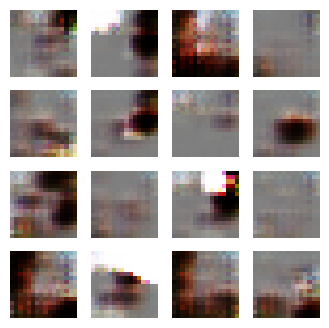

Epoch 6, Gen Loss: 3.26888370513916, Disc Loss: 0.46690666675567627, Time: 6.536929368972778


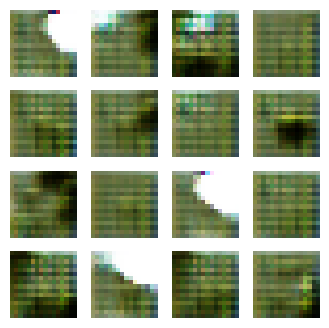

Epoch 7, Gen Loss: 4.025851726531982, Disc Loss: 0.30092257261276245, Time: 6.5731635093688965


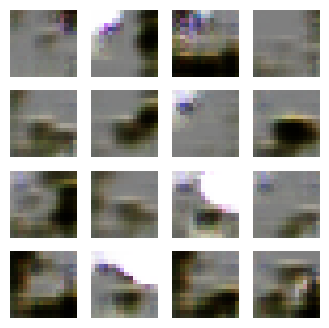

Epoch 8, Gen Loss: 3.7819433212280273, Disc Loss: 0.4165310263633728, Time: 6.695835828781128


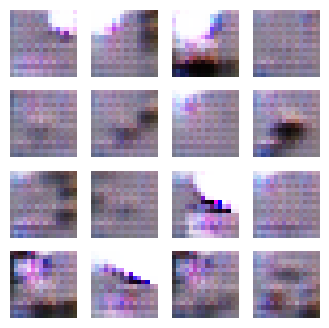

Epoch 9, Gen Loss: 4.4093017578125, Disc Loss: 0.48354601860046387, Time: 6.8169026374816895


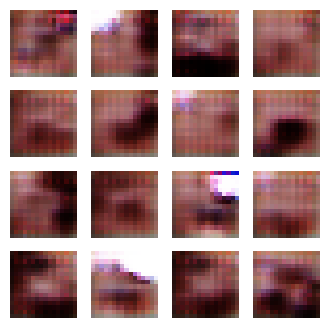

Epoch 10, Gen Loss: 6.977481842041016, Disc Loss: 0.42287397384643555, Time: 6.706476926803589


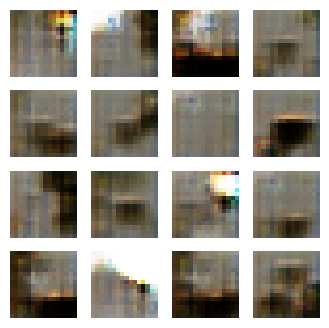

Epoch 11, Gen Loss: 4.7559661865234375, Disc Loss: 1.2141265869140625, Time: 6.4791059494018555


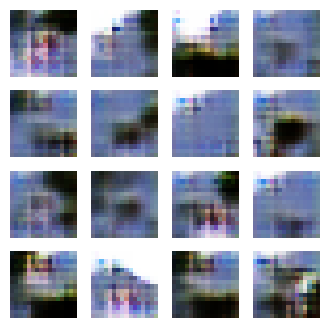

Epoch 12, Gen Loss: 5.299429893493652, Disc Loss: 0.574134886264801, Time: 6.628762245178223


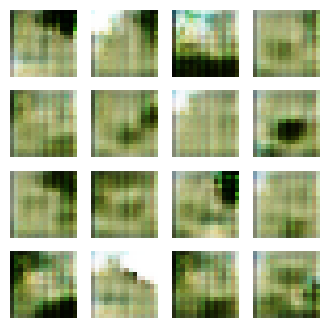

Epoch 13, Gen Loss: 5.931853294372559, Disc Loss: 0.49389827251434326, Time: 6.764591455459595


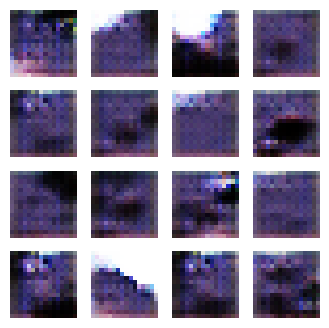

Epoch 14, Gen Loss: 11.142221450805664, Disc Loss: 1.4334889650344849, Time: 6.463332653045654


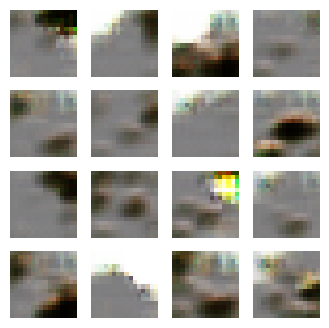

Epoch 15, Gen Loss: 4.072490692138672, Disc Loss: 0.3689393103122711, Time: 6.428327560424805


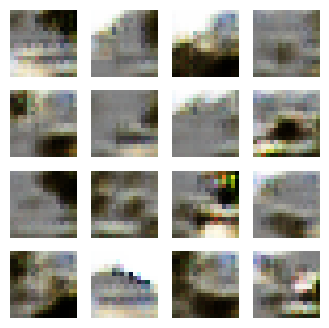

Epoch 16, Gen Loss: 2.7584638595581055, Disc Loss: 0.3613564074039459, Time: 6.43873143196106


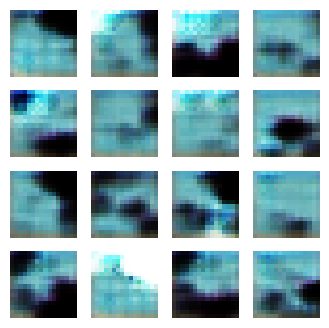

Epoch 17, Gen Loss: 8.265422821044922, Disc Loss: 1.323926568031311, Time: 6.461067199707031


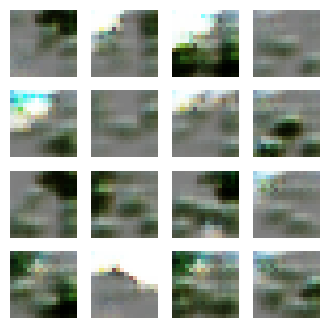

Epoch 18, Gen Loss: 4.2976579666137695, Disc Loss: 0.29525917768478394, Time: 6.754451751708984


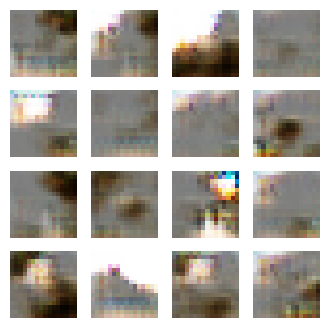

Epoch 19, Gen Loss: 2.9049644470214844, Disc Loss: 0.9085774421691895, Time: 6.486566066741943


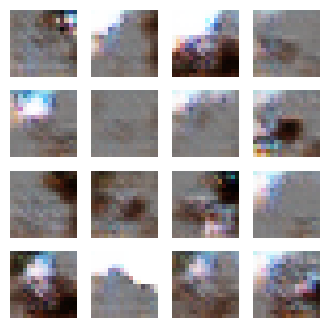

Epoch 20, Gen Loss: 3.9355082511901855, Disc Loss: 0.5124668478965759, Time: 6.522428750991821


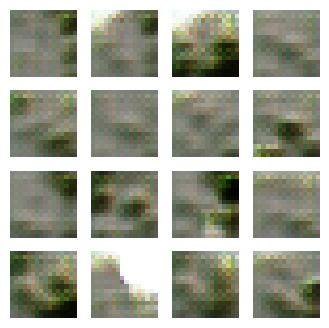

Epoch 21, Gen Loss: 2.9008829593658447, Disc Loss: 0.317372590303421, Time: 6.470460653305054


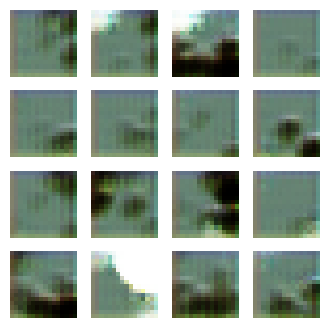

Epoch 22, Gen Loss: 2.7400646209716797, Disc Loss: 1.5367710590362549, Time: 6.764108657836914


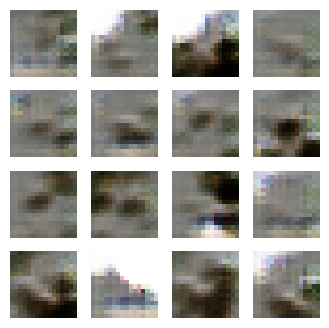

Epoch 23, Gen Loss: 3.1459779739379883, Disc Loss: 0.7714047431945801, Time: 6.507172346115112


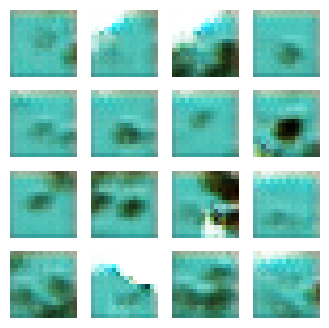

Epoch 24, Gen Loss: 6.578417778015137, Disc Loss: 0.7212337255477905, Time: 6.4730002880096436


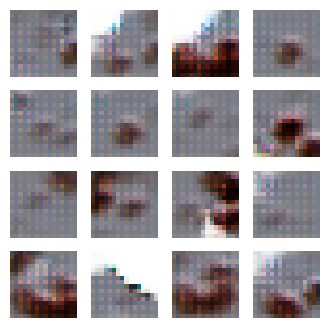

Epoch 25, Gen Loss: 4.975393295288086, Disc Loss: 0.44019564986228943, Time: 6.638967752456665


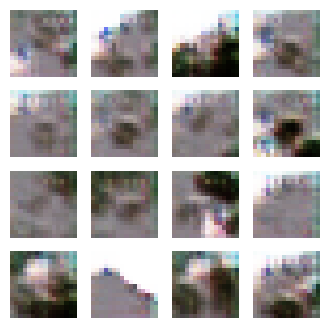

Epoch 26, Gen Loss: 2.5414366722106934, Disc Loss: 0.49432241916656494, Time: 6.7400901317596436


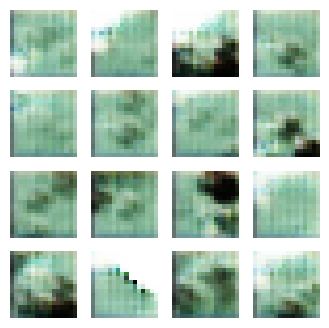

Epoch 27, Gen Loss: 3.4788661003112793, Disc Loss: 0.7764011025428772, Time: 6.618124485015869


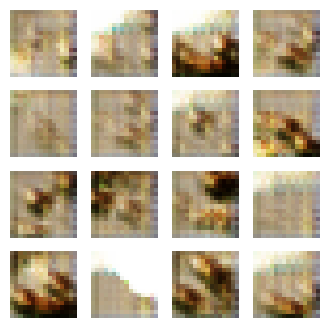

Epoch 28, Gen Loss: 6.603218078613281, Disc Loss: 0.28336524963378906, Time: 6.503912448883057


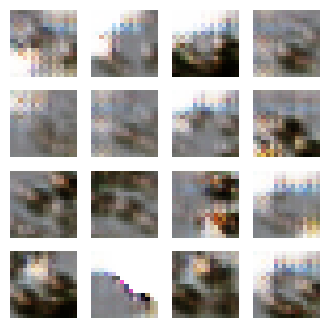

Epoch 29, Gen Loss: 3.5117146968841553, Disc Loss: 0.48254120349884033, Time: 6.627453088760376


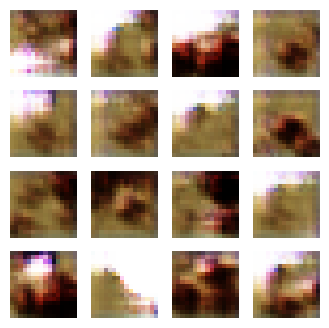

Epoch 30, Gen Loss: 4.362982273101807, Disc Loss: 0.3241194486618042, Time: 6.764936685562134


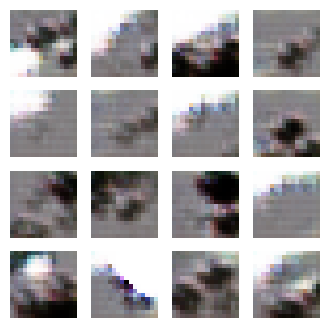

Epoch 31, Gen Loss: 3.356168746948242, Disc Loss: 0.5210545063018799, Time: 6.471985816955566


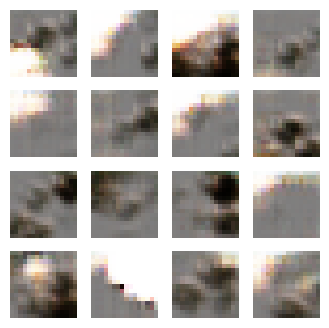

Epoch 32, Gen Loss: 1.934322714805603, Disc Loss: 1.2280170917510986, Time: 6.514647483825684


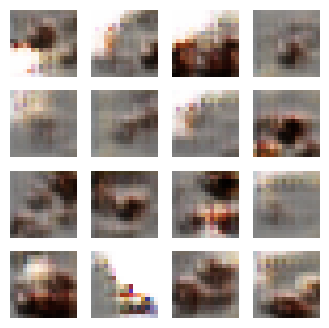

Epoch 33, Gen Loss: 2.369319438934326, Disc Loss: 0.8204073905944824, Time: 6.482851028442383


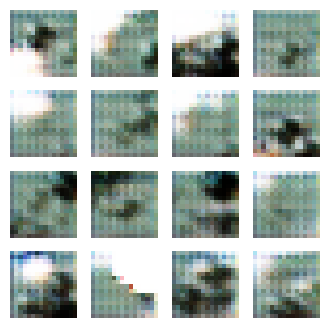

Epoch 34, Gen Loss: 2.300044059753418, Disc Loss: 0.9044671058654785, Time: 6.483514070510864


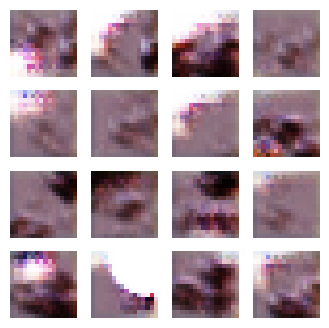

Epoch 35, Gen Loss: 4.754709243774414, Disc Loss: 0.26793599128723145, Time: 6.750236749649048


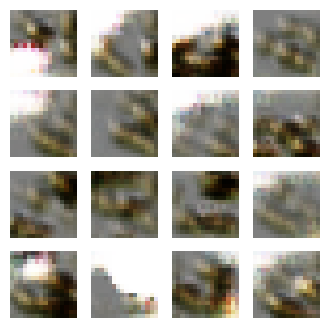

Epoch 36, Gen Loss: 3.190192222595215, Disc Loss: 0.27408841252326965, Time: 6.4653401374816895


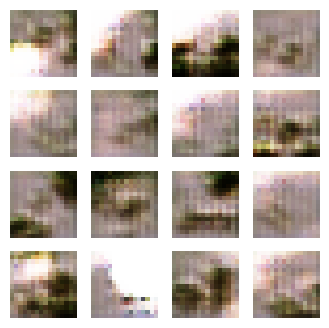

Epoch 37, Gen Loss: 2.253615379333496, Disc Loss: 0.5911750793457031, Time: 6.475018262863159


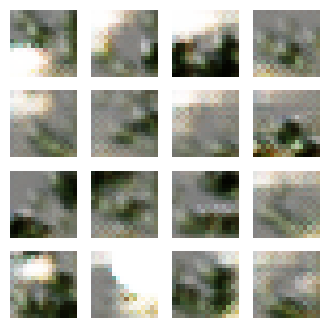

Epoch 38, Gen Loss: 2.6513073444366455, Disc Loss: 0.7602975368499756, Time: 6.520621299743652


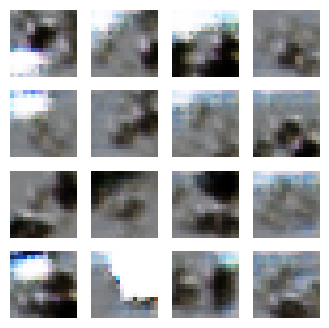

Epoch 39, Gen Loss: 2.9005918502807617, Disc Loss: 0.8236557841300964, Time: 6.758909463882446


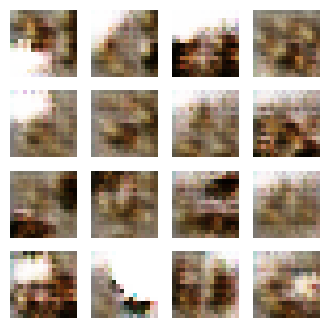

Epoch 40, Gen Loss: 4.799935340881348, Disc Loss: 0.45150309801101685, Time: 6.609945058822632


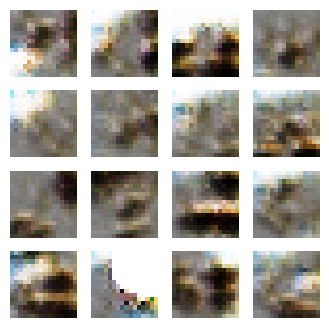

Epoch 41, Gen Loss: 2.9354703426361084, Disc Loss: 0.9555572271347046, Time: 6.465526342391968


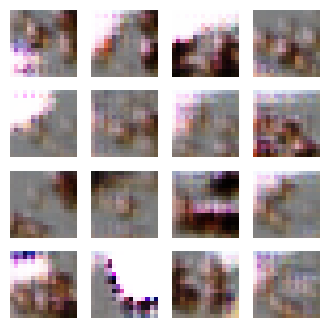

Epoch 42, Gen Loss: 3.590928316116333, Disc Loss: 0.28816142678260803, Time: 6.617851495742798


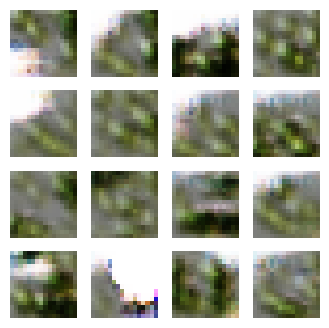

Epoch 43, Gen Loss: 3.62454891204834, Disc Loss: 0.5524450540542603, Time: 6.505328416824341


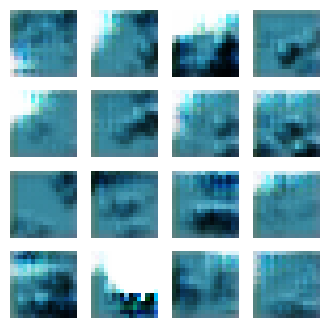

Epoch 44, Gen Loss: 7.730987548828125, Disc Loss: 0.47904646396636963, Time: 6.808797121047974


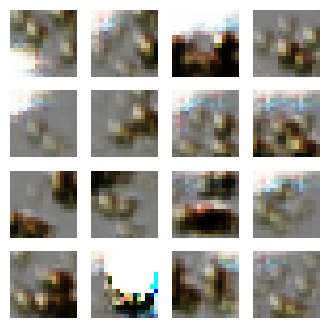

Epoch 45, Gen Loss: 3.6654348373413086, Disc Loss: 0.6234633326530457, Time: 6.4599926471710205


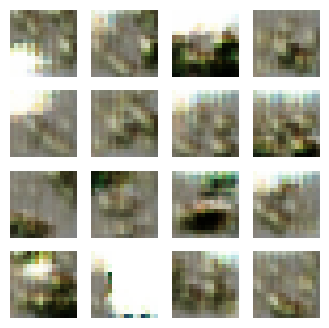

Epoch 46, Gen Loss: 3.8592891693115234, Disc Loss: 0.4879990220069885, Time: 6.498506784439087


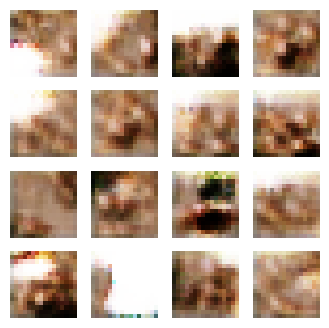

Epoch 47, Gen Loss: 4.471793174743652, Disc Loss: 0.449526846408844, Time: 6.682373762130737


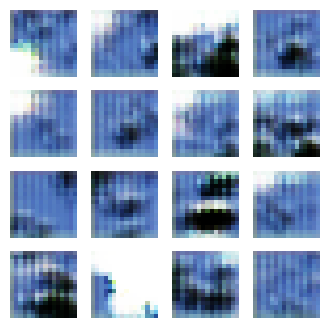

Epoch 48, Gen Loss: 9.511956214904785, Disc Loss: 0.5677556395530701, Time: 6.727323532104492


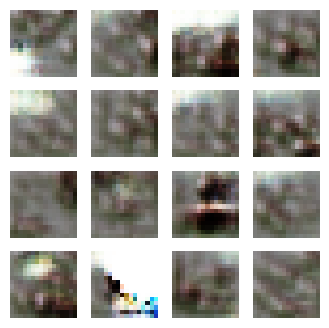

Epoch 49, Gen Loss: 3.242112159729004, Disc Loss: 0.6416580080986023, Time: 6.478511095046997


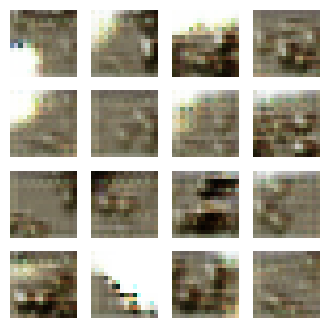

Epoch 50, Gen Loss: 3.868311882019043, Disc Loss: 0.3621123433113098, Time: 6.500845909118652


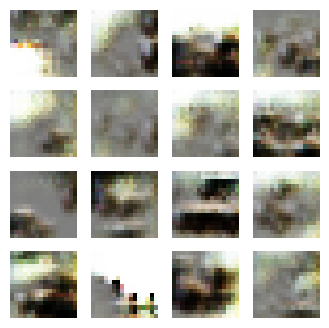

Epoch 51, Gen Loss: 3.675255298614502, Disc Loss: 0.4568993151187897, Time: 6.443302154541016


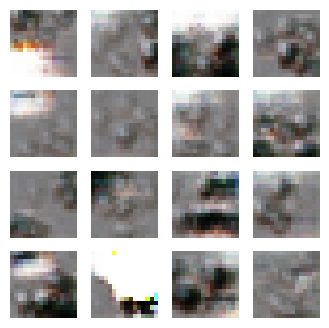

Epoch 52, Gen Loss: 1.408725619316101, Disc Loss: 1.7088127136230469, Time: 6.5111167430877686


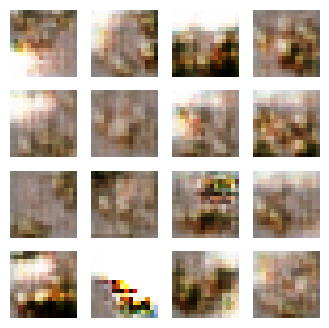

Epoch 53, Gen Loss: 3.3582959175109863, Disc Loss: 0.7817957997322083, Time: 7.069001913070679


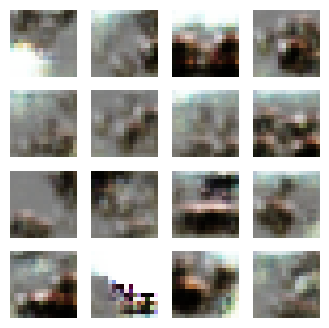

Epoch 54, Gen Loss: 2.4733924865722656, Disc Loss: 0.3760964870452881, Time: 6.491364240646362


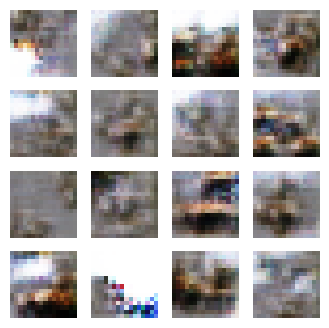

Epoch 55, Gen Loss: 3.338707685470581, Disc Loss: 0.44757795333862305, Time: 6.649573087692261


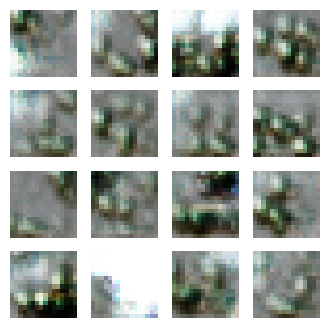

Epoch 56, Gen Loss: 2.8030998706817627, Disc Loss: 0.5735450983047485, Time: 6.518584966659546


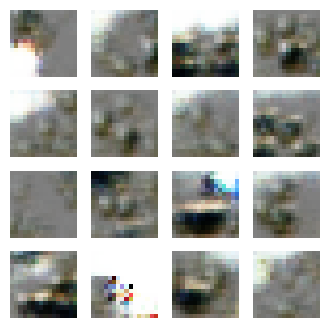

Epoch 57, Gen Loss: 2.7381465435028076, Disc Loss: 0.38561466336250305, Time: 6.810883522033691


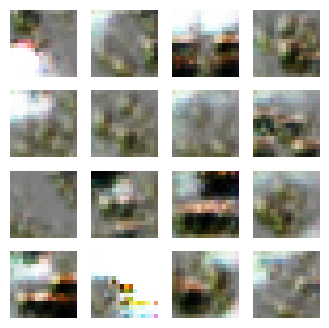

Epoch 58, Gen Loss: 4.511785507202148, Disc Loss: 0.8239966034889221, Time: 6.498540878295898


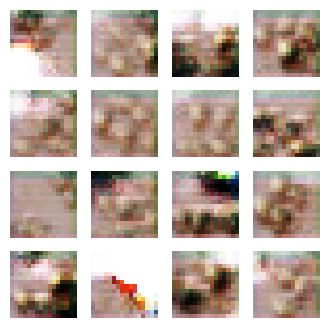

Epoch 59, Gen Loss: 3.208148956298828, Disc Loss: 1.233945369720459, Time: 6.4975950717926025


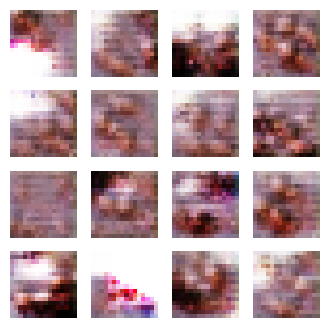

Epoch 60, Gen Loss: 3.582266330718994, Disc Loss: 0.3919565677642822, Time: 6.475972890853882


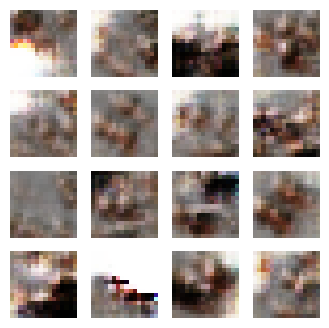

Epoch 61, Gen Loss: 2.3793904781341553, Disc Loss: 0.715904712677002, Time: 6.732139825820923


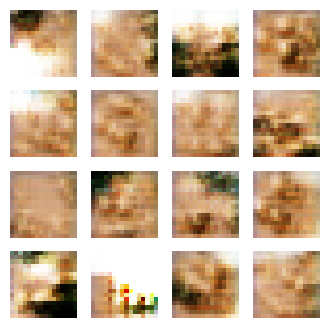

Epoch 62, Gen Loss: 5.5990705490112305, Disc Loss: 0.2665148675441742, Time: 6.45387864112854


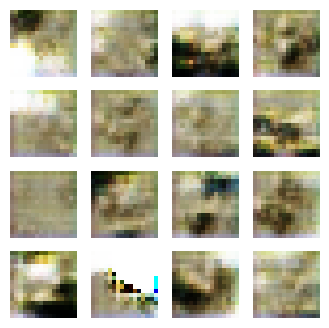

Epoch 63, Gen Loss: 2.2290050983428955, Disc Loss: 0.7767671346664429, Time: 6.49141788482666


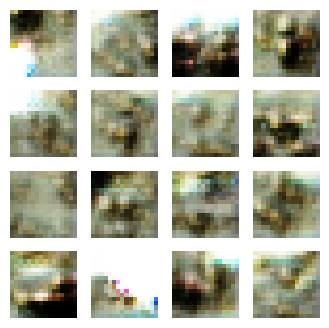

Epoch 64, Gen Loss: 3.709547996520996, Disc Loss: 0.3283807039260864, Time: 6.452290058135986


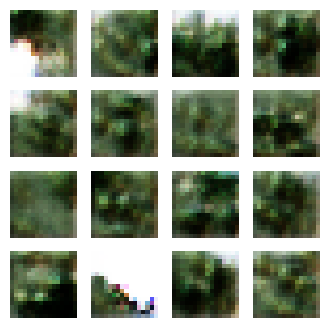

Epoch 65, Gen Loss: 6.080528259277344, Disc Loss: 0.8361923694610596, Time: 6.4683051109313965


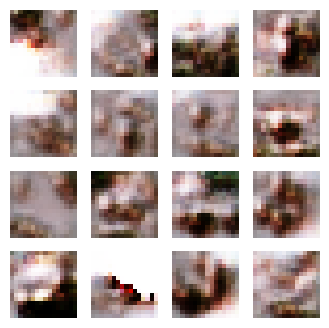

Epoch 66, Gen Loss: 3.5068602561950684, Disc Loss: 0.5116347670555115, Time: 6.922275066375732


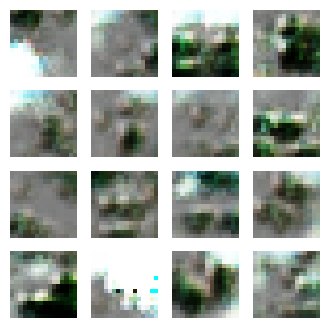

Epoch 67, Gen Loss: 2.718620538711548, Disc Loss: 0.5457429885864258, Time: 6.4998779296875


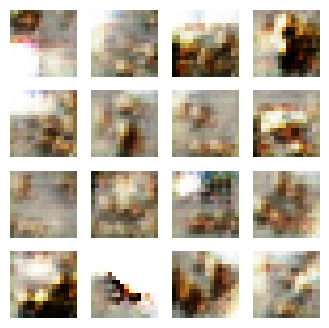

Epoch 68, Gen Loss: 4.285728454589844, Disc Loss: 0.6430982947349548, Time: 10.531884670257568


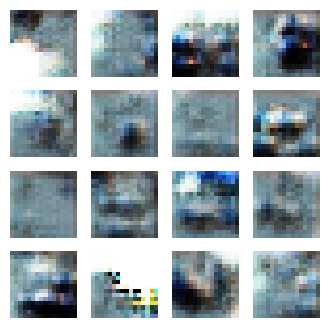

Epoch 69, Gen Loss: 3.251570701599121, Disc Loss: 0.34172162413597107, Time: 6.512693643569946


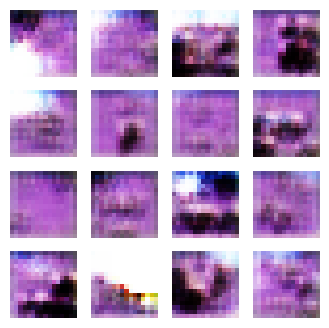

Epoch 70, Gen Loss: 16.905641555786133, Disc Loss: 0.6384270787239075, Time: 6.712562561035156


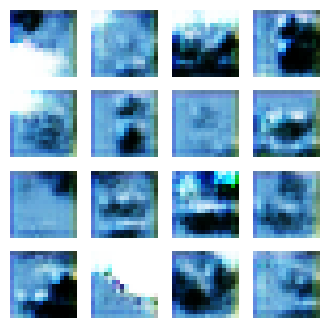

Epoch 71, Gen Loss: 11.027552604675293, Disc Loss: 1.699561595916748, Time: 6.58332633972168


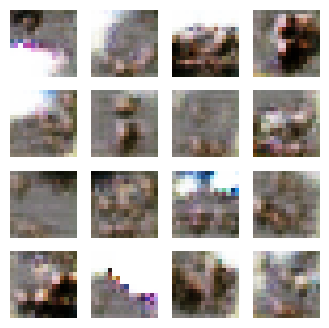

Epoch 72, Gen Loss: 2.7731845378875732, Disc Loss: 0.5242938995361328, Time: 6.5753419399261475


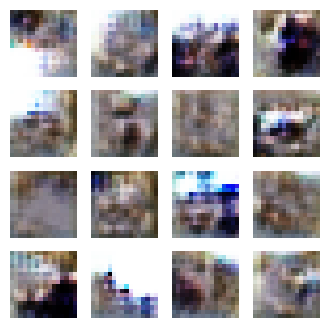

Epoch 73, Gen Loss: 1.673149585723877, Disc Loss: 1.638655424118042, Time: 6.738434314727783


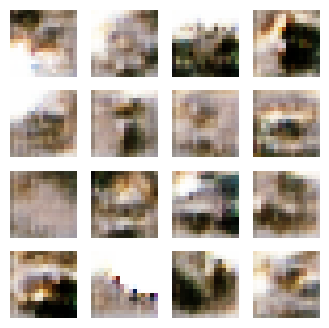

Epoch 74, Gen Loss: 2.873538017272949, Disc Loss: 0.7001634836196899, Time: 6.517238140106201


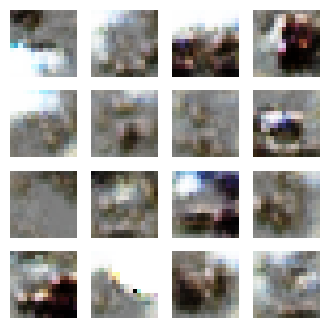

Epoch 75, Gen Loss: 2.113776922225952, Disc Loss: 0.49612510204315186, Time: 6.783930540084839


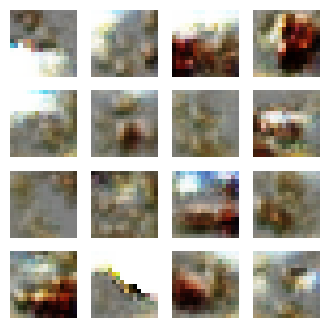

Epoch 76, Gen Loss: 2.410449981689453, Disc Loss: 0.7833779454231262, Time: 6.466171503067017


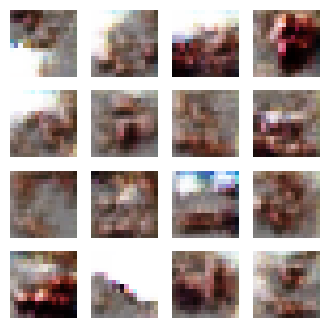

Epoch 77, Gen Loss: 3.665656089782715, Disc Loss: 0.6574928760528564, Time: 6.494514226913452


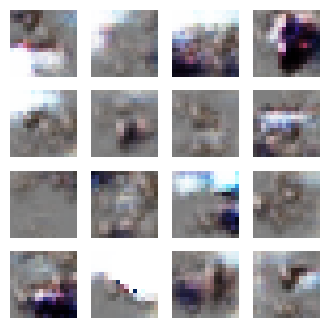

Epoch 78, Gen Loss: 2.504554510116577, Disc Loss: 0.4077998995780945, Time: 6.4793336391448975


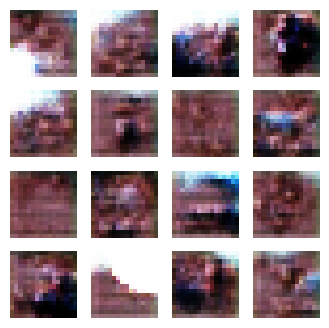

Epoch 79, Gen Loss: 4.309442520141602, Disc Loss: 0.3111976087093353, Time: 6.755542039871216


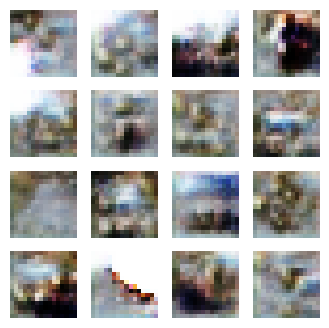

Epoch 80, Gen Loss: 2.95414400100708, Disc Loss: 0.8455396890640259, Time: 6.488980531692505


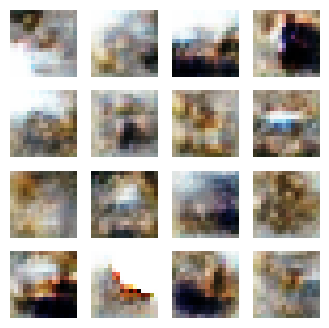

Epoch 81, Gen Loss: 2.219569206237793, Disc Loss: 1.0023930072784424, Time: 6.440943002700806


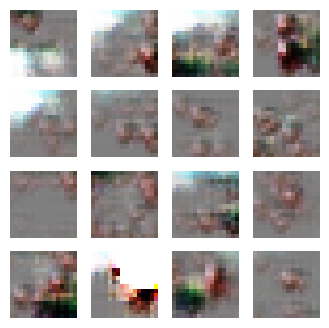

Epoch 82, Gen Loss: 3.730543613433838, Disc Loss: 0.5340468883514404, Time: 6.499224901199341


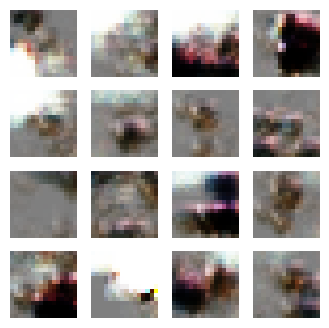

Epoch 83, Gen Loss: 2.639665365219116, Disc Loss: 0.7500119209289551, Time: 6.772763252258301


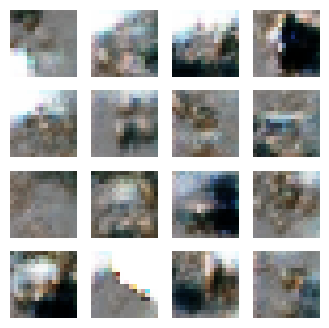

Epoch 84, Gen Loss: 1.5418950319290161, Disc Loss: 1.2500662803649902, Time: 6.648800849914551


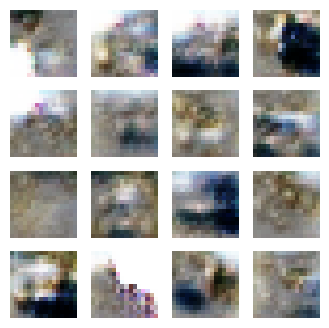

Epoch 85, Gen Loss: 1.78529953956604, Disc Loss: 0.8365556597709656, Time: 6.52501916885376


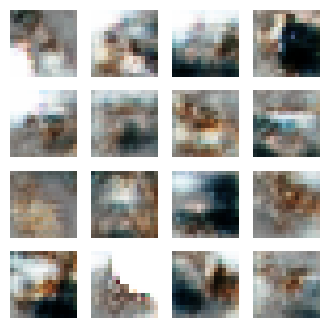

Epoch 86, Gen Loss: 2.4340693950653076, Disc Loss: 0.934238076210022, Time: 6.634923219680786


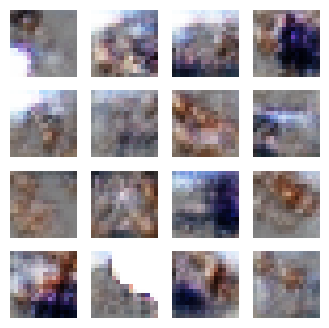

Epoch 87, Gen Loss: 2.8191065788269043, Disc Loss: 0.6382858753204346, Time: 6.564686298370361


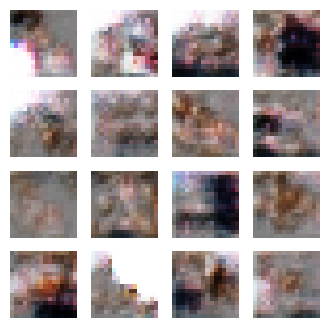

Epoch 88, Gen Loss: 1.8532183170318604, Disc Loss: 0.9051741361618042, Time: 6.9966137409210205


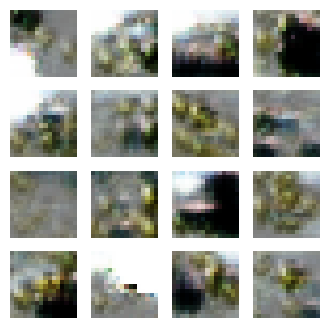

Epoch 89, Gen Loss: 2.9795644283294678, Disc Loss: 0.6589820384979248, Time: 6.507351875305176


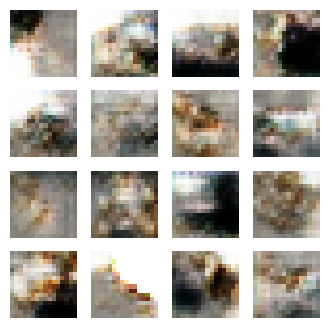

Epoch 90, Gen Loss: 3.3107333183288574, Disc Loss: 0.772834300994873, Time: 6.473116397857666


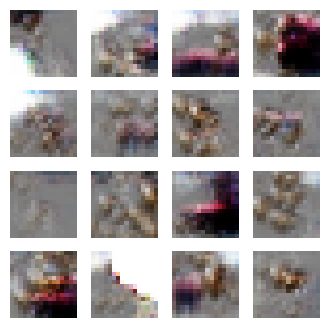

Epoch 91, Gen Loss: 2.4243319034576416, Disc Loss: 0.5028586983680725, Time: 6.441800355911255


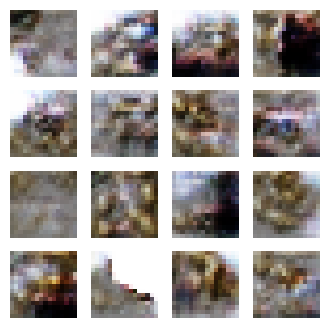

Epoch 92, Gen Loss: 2.1222572326660156, Disc Loss: 0.781032383441925, Time: 6.839433670043945


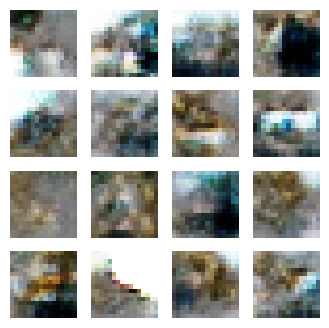

Epoch 93, Gen Loss: 2.7460575103759766, Disc Loss: 0.7303139567375183, Time: 6.480978965759277


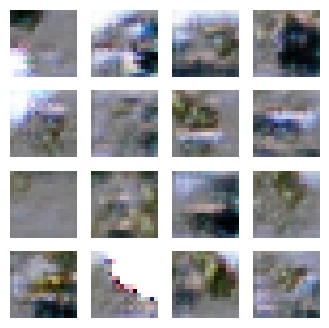

Epoch 94, Gen Loss: 2.4559807777404785, Disc Loss: 0.6845320463180542, Time: 6.536542892456055


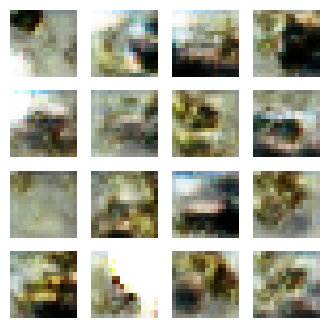

Epoch 95, Gen Loss: 2.3402857780456543, Disc Loss: 0.7369727492332458, Time: 6.4896016120910645


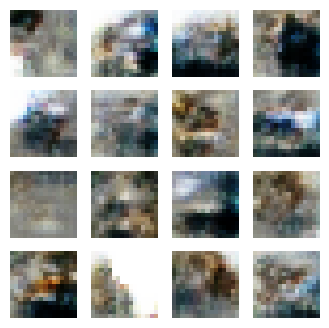

Epoch 96, Gen Loss: 2.2685933113098145, Disc Loss: 1.2784361839294434, Time: 6.490184307098389


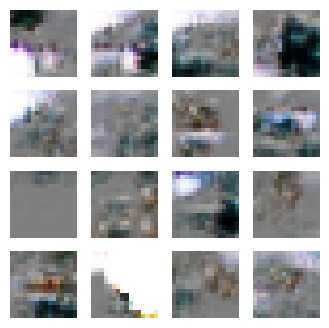

Epoch 97, Gen Loss: 2.324014902114868, Disc Loss: 0.5956014394760132, Time: 6.768301963806152


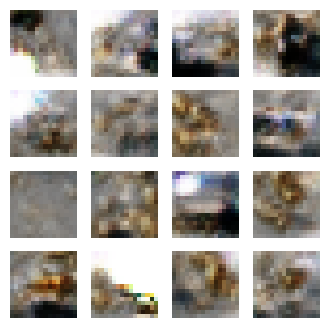

Epoch 98, Gen Loss: 1.942858338356018, Disc Loss: 0.8670341968536377, Time: 6.528035402297974


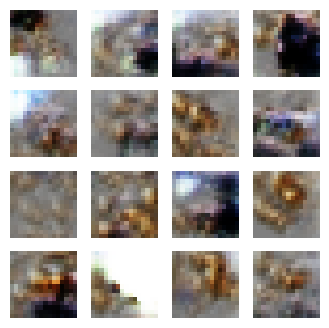

Epoch 99, Gen Loss: 2.1360530853271484, Disc Loss: 0.8246636390686035, Time: 6.663116931915283


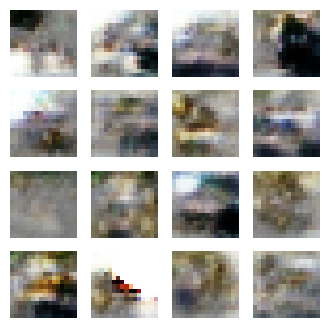

Epoch 100, Gen Loss: 1.6380754709243774, Disc Loss: 0.8166465163230896, Time: 6.507146596908569


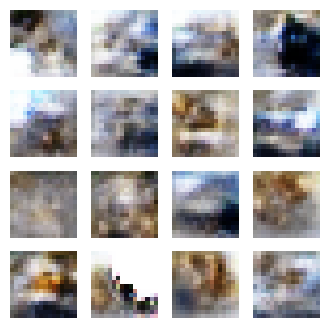

Epoch 101, Gen Loss: 2.1339774131774902, Disc Loss: 0.8868396282196045, Time: 7.027267217636108


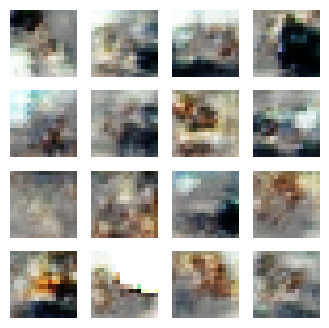

Epoch 102, Gen Loss: 2.0106148719787598, Disc Loss: 0.8379690647125244, Time: 6.521653175354004


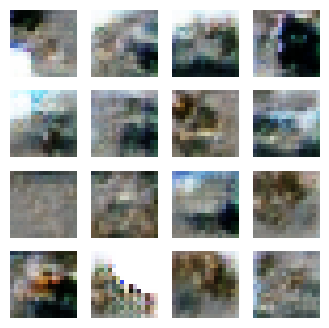

Epoch 103, Gen Loss: 2.1014339923858643, Disc Loss: 1.4587291479110718, Time: 6.537075996398926


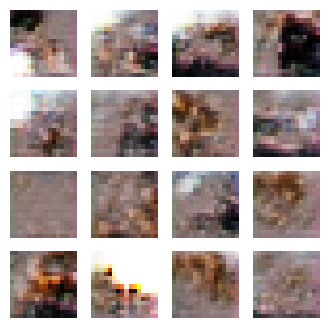

Epoch 104, Gen Loss: 2.299689531326294, Disc Loss: 0.4400726556777954, Time: 6.48250150680542


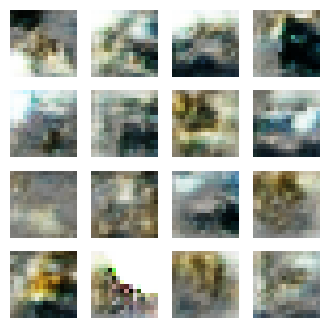

Epoch 105, Gen Loss: 2.353212356567383, Disc Loss: 0.524490237236023, Time: 6.795830726623535


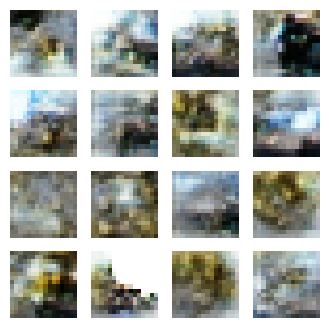

Epoch 106, Gen Loss: 1.8719899654388428, Disc Loss: 0.8084449768066406, Time: 6.497076034545898


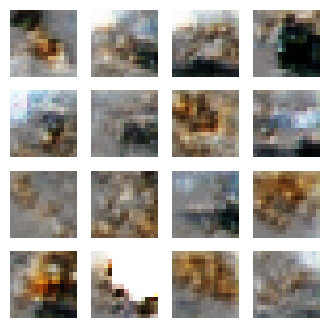

Epoch 107, Gen Loss: 1.7930690050125122, Disc Loss: 1.3020105361938477, Time: 6.496271848678589


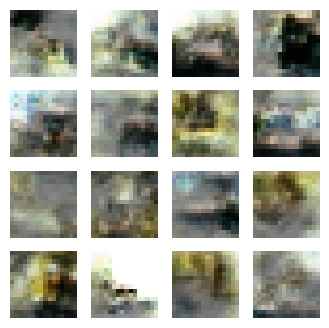

Epoch 108, Gen Loss: 1.075045108795166, Disc Loss: 1.212105393409729, Time: 6.502536773681641


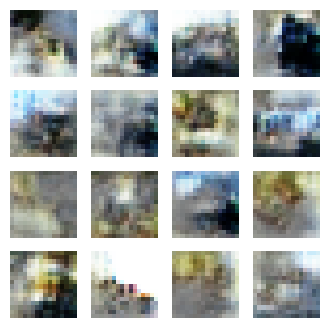

Epoch 109, Gen Loss: 1.8638437986373901, Disc Loss: 1.2063348293304443, Time: 6.509417533874512


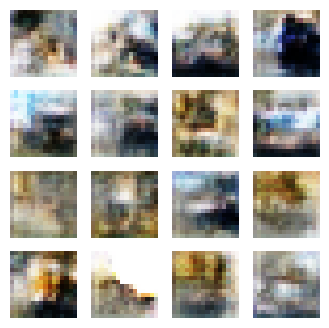

Epoch 110, Gen Loss: 2.3937320709228516, Disc Loss: 0.6546885967254639, Time: 6.797412633895874


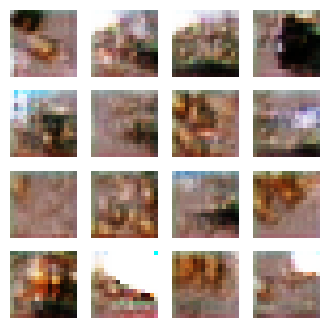

Epoch 111, Gen Loss: 3.318208694458008, Disc Loss: 0.5629777312278748, Time: 6.44727635383606


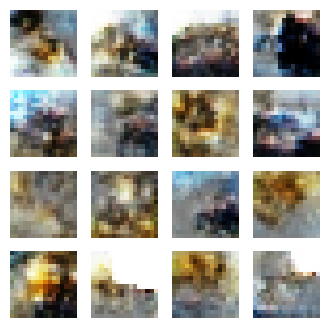

Epoch 112, Gen Loss: 2.355560302734375, Disc Loss: 0.95394366979599, Time: 6.681570053100586


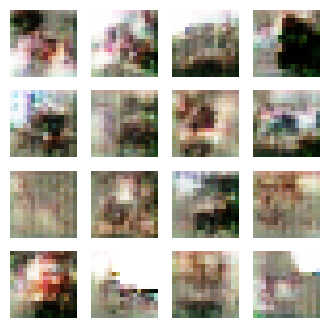

Epoch 113, Gen Loss: 3.5108678340911865, Disc Loss: 1.2951653003692627, Time: 6.552775859832764


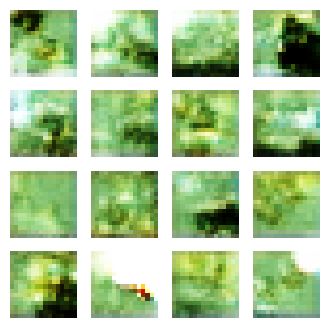

Epoch 114, Gen Loss: 6.9316511154174805, Disc Loss: 0.1654745489358902, Time: 6.985754013061523


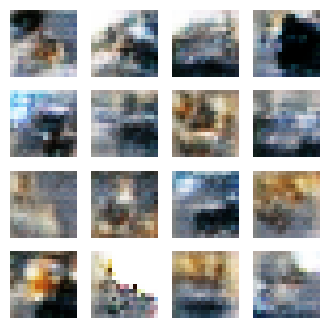

Epoch 115, Gen Loss: 1.6510870456695557, Disc Loss: 1.3621597290039062, Time: 6.50138783454895


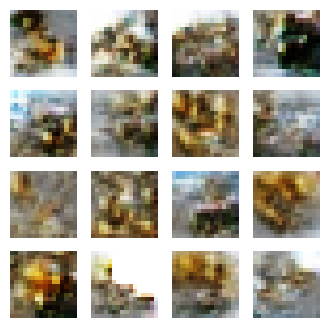

Epoch 116, Gen Loss: 3.1509783267974854, Disc Loss: 0.7660362720489502, Time: 6.612271547317505


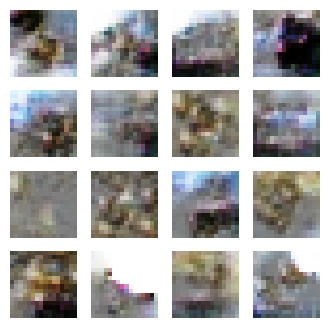

Epoch 117, Gen Loss: 2.227907180786133, Disc Loss: 0.6937792897224426, Time: 6.494840621948242


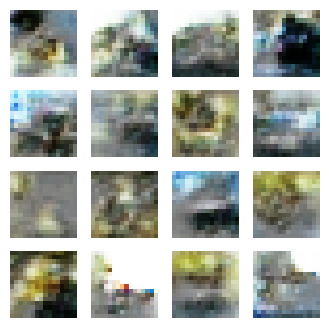

Epoch 118, Gen Loss: 1.598993182182312, Disc Loss: 0.7906285524368286, Time: 6.758324861526489


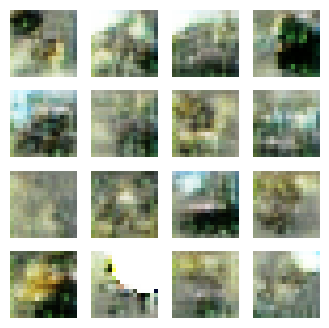

Epoch 119, Gen Loss: 1.4001445770263672, Disc Loss: 1.9697387218475342, Time: 6.495230674743652


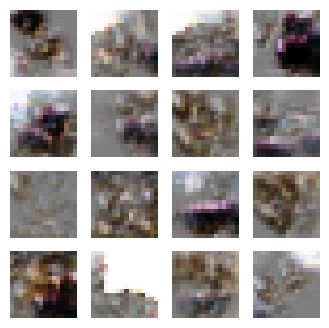

Epoch 120, Gen Loss: 1.7191652059555054, Disc Loss: 0.5840027332305908, Time: 6.4939141273498535


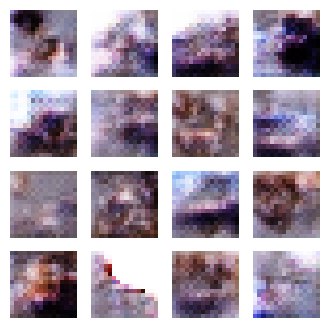

Epoch 121, Gen Loss: 3.041964530944824, Disc Loss: 1.0126029253005981, Time: 6.4575746059417725


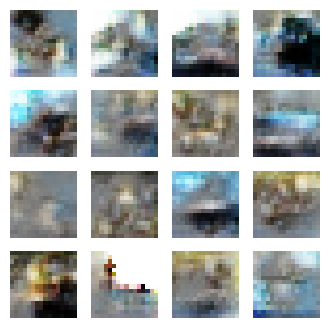

Epoch 122, Gen Loss: 1.824620246887207, Disc Loss: 0.8379333019256592, Time: 6.539047956466675


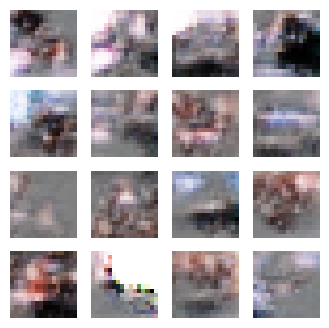

Epoch 123, Gen Loss: 2.2880685329437256, Disc Loss: 0.5548653602600098, Time: 6.796834468841553


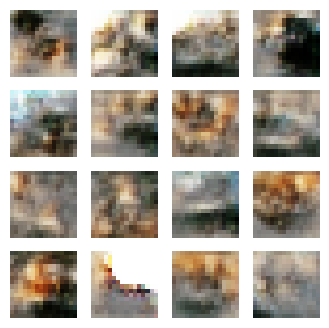

Epoch 124, Gen Loss: 1.9445691108703613, Disc Loss: 0.8946304321289062, Time: 6.490597724914551


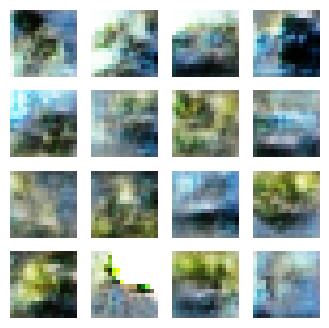

Epoch 125, Gen Loss: 2.8873233795166016, Disc Loss: 0.4825662672519684, Time: 6.595534563064575


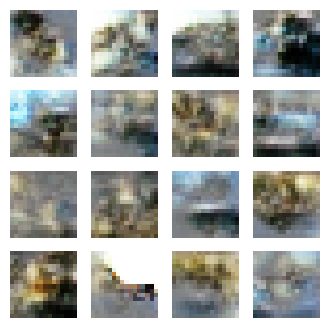

Epoch 126, Gen Loss: 1.670349359512329, Disc Loss: 0.9356291890144348, Time: 6.477479934692383


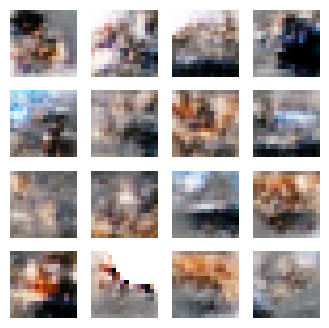

Epoch 127, Gen Loss: 1.5364331007003784, Disc Loss: 1.2635514736175537, Time: 6.96793794631958


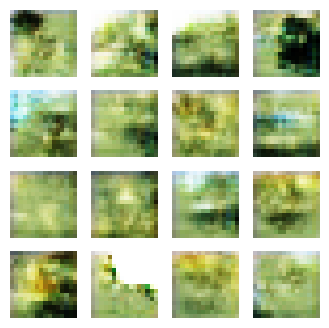

Epoch 128, Gen Loss: 3.6649675369262695, Disc Loss: 0.5102138519287109, Time: 6.529221057891846


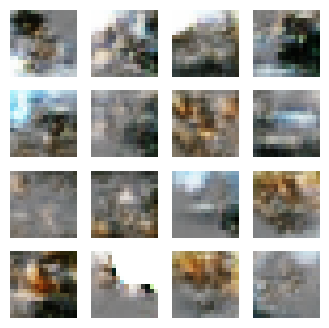

Epoch 129, Gen Loss: 1.4406095743179321, Disc Loss: 0.7836197018623352, Time: 6.691755056381226


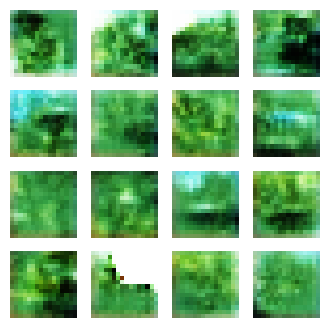

Epoch 130, Gen Loss: 7.216554641723633, Disc Loss: 0.2177428901195526, Time: 6.489643335342407


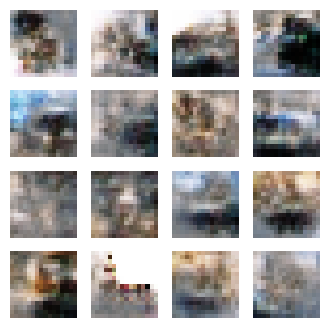

Epoch 131, Gen Loss: 1.641874074935913, Disc Loss: 0.7996445894241333, Time: 6.453148126602173


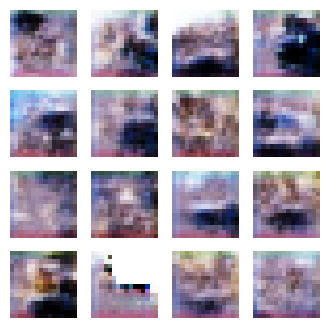

Epoch 132, Gen Loss: 3.1429107189178467, Disc Loss: 0.45820197463035583, Time: 6.768254041671753


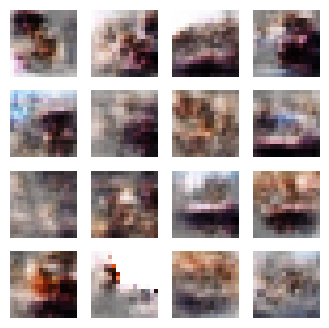

Epoch 133, Gen Loss: 1.2215477228164673, Disc Loss: 2.204695701599121, Time: 6.483733892440796


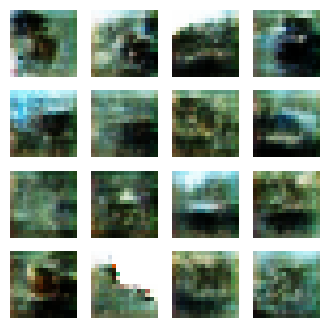

Epoch 134, Gen Loss: 4.114876747131348, Disc Loss: 0.7846643328666687, Time: 6.486461162567139


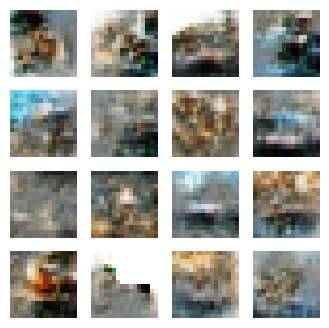

Epoch 135, Gen Loss: 2.1267895698547363, Disc Loss: 0.7372149229049683, Time: 6.492741107940674


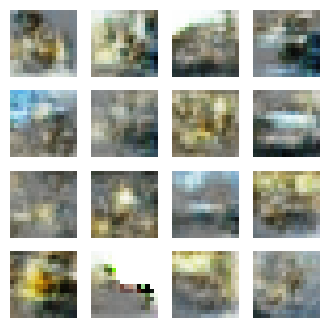

Epoch 136, Gen Loss: 1.7750532627105713, Disc Loss: 0.7991591691970825, Time: 6.761426687240601


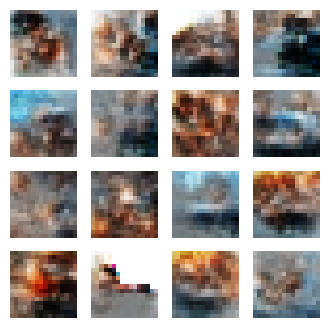

Epoch 137, Gen Loss: 1.8625346422195435, Disc Loss: 0.8037986159324646, Time: 6.489549875259399


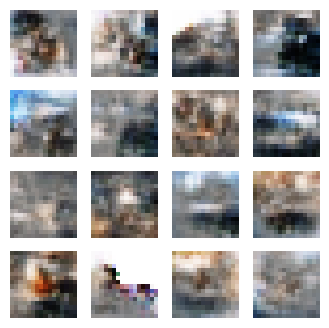

Epoch 138, Gen Loss: 1.5392266511917114, Disc Loss: 1.064664363861084, Time: 6.5197813510894775


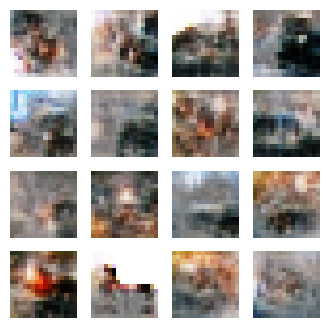

Epoch 139, Gen Loss: 1.7427523136138916, Disc Loss: 1.6999025344848633, Time: 6.4870078563690186


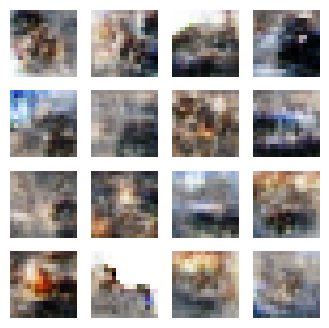

Epoch 140, Gen Loss: 2.3806090354919434, Disc Loss: 0.6905591487884521, Time: 7.029428243637085


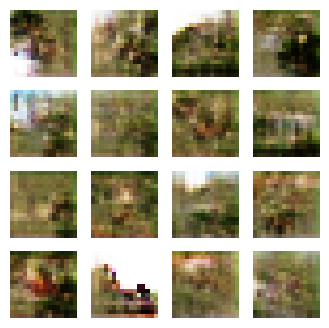

Epoch 141, Gen Loss: 5.200497627258301, Disc Loss: 0.5038049221038818, Time: 6.489611864089966


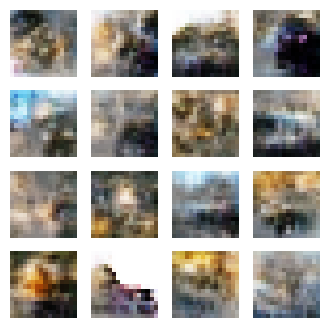

Epoch 142, Gen Loss: 1.6180224418640137, Disc Loss: 1.1076858043670654, Time: 6.6700358390808105


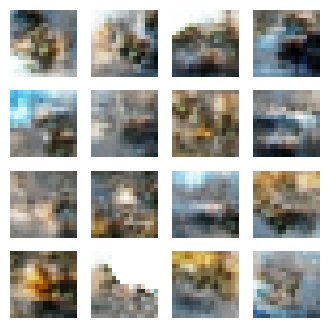

Epoch 143, Gen Loss: 1.8157660961151123, Disc Loss: 0.7386468648910522, Time: 6.5230748653411865


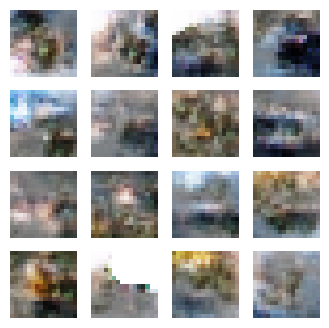

Epoch 144, Gen Loss: 1.6193664073944092, Disc Loss: 0.8403276205062866, Time: 6.515333890914917


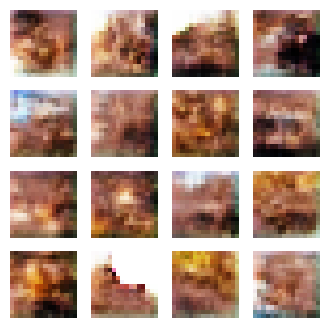

Epoch 145, Gen Loss: 3.043951988220215, Disc Loss: 0.3756163716316223, Time: 6.75264835357666


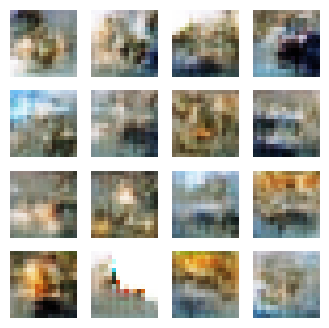

Epoch 146, Gen Loss: 0.8301989436149597, Disc Loss: 1.710193157196045, Time: 6.493103742599487


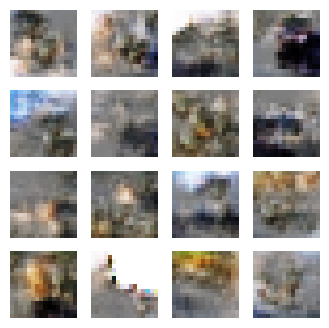

Epoch 147, Gen Loss: 1.9380803108215332, Disc Loss: 0.7669026255607605, Time: 6.5382585525512695


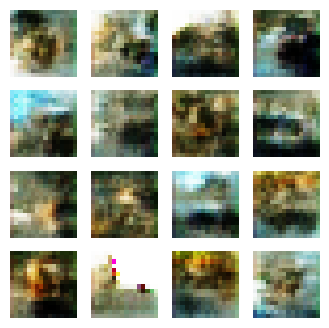

Epoch 148, Gen Loss: 2.7289810180664062, Disc Loss: 0.877274751663208, Time: 6.5268683433532715


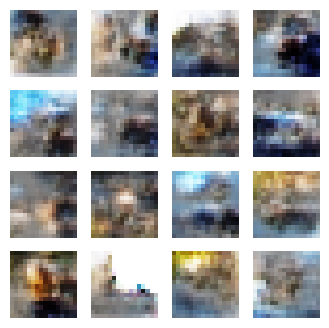

Epoch 149, Gen Loss: 3.9295578002929688, Disc Loss: 1.0257256031036377, Time: 6.814899921417236


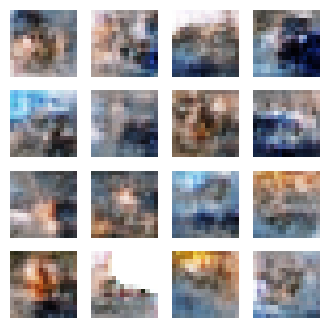

Epoch 150, Gen Loss: 1.3395054340362549, Disc Loss: 1.138814091682434, Time: 6.491167306900024


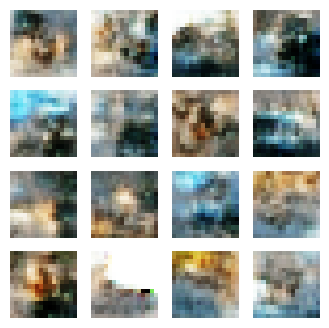

Epoch 151, Gen Loss: 1.9606444835662842, Disc Loss: 0.7698296904563904, Time: 6.455042362213135


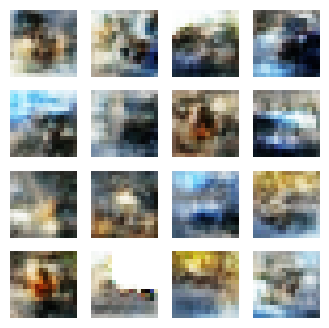

Epoch 152, Gen Loss: 2.0048017501831055, Disc Loss: 0.7796277403831482, Time: 6.487334489822388


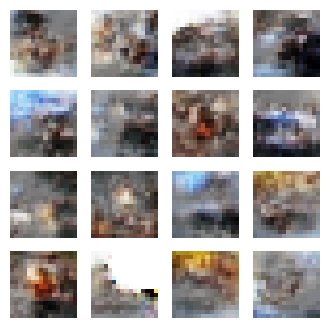

Epoch 153, Gen Loss: 1.7354156970977783, Disc Loss: 0.7431358695030212, Time: 6.607172012329102


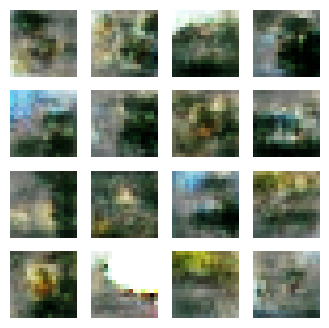

Epoch 154, Gen Loss: 2.6407625675201416, Disc Loss: 1.454115867614746, Time: 6.825505495071411


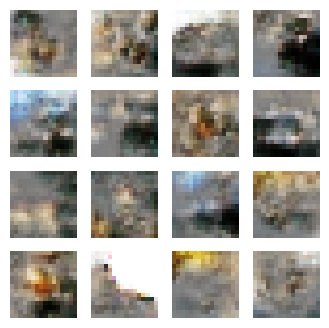

Epoch 155, Gen Loss: 2.440798044204712, Disc Loss: 1.1014389991760254, Time: 6.658555030822754


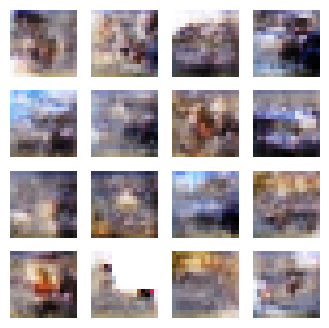

Epoch 156, Gen Loss: 1.9920265674591064, Disc Loss: 0.8492456674575806, Time: 6.521237373352051


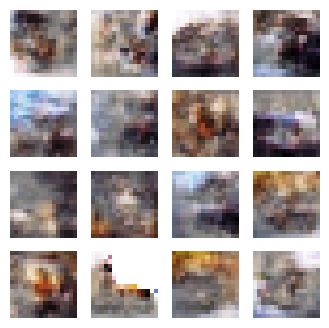

Epoch 157, Gen Loss: 1.4663348197937012, Disc Loss: 1.0992555618286133, Time: 6.643387079238892


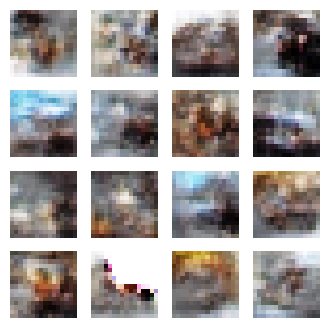

Epoch 158, Gen Loss: 1.5434119701385498, Disc Loss: 0.9188975095748901, Time: 6.748426914215088


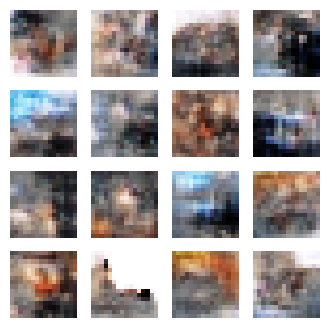

Epoch 159, Gen Loss: 1.7270629405975342, Disc Loss: 0.9533934593200684, Time: 6.480813503265381


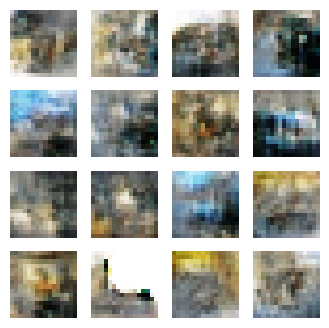

Epoch 160, Gen Loss: 2.2518649101257324, Disc Loss: 0.816464364528656, Time: 6.496025800704956


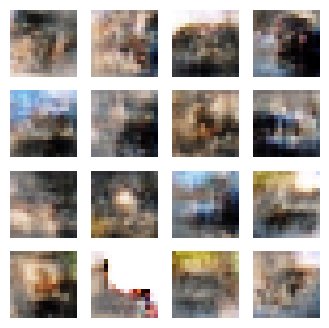

Epoch 161, Gen Loss: 0.9561630487442017, Disc Loss: 1.4517613649368286, Time: 6.463314533233643


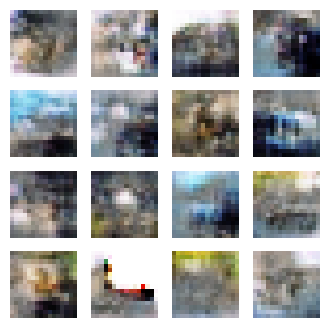

Epoch 162, Gen Loss: 1.465946912765503, Disc Loss: 0.9523981809616089, Time: 6.473624229431152


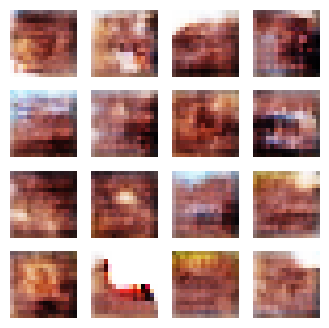

Epoch 163, Gen Loss: 3.9621353149414062, Disc Loss: 0.5130183100700378, Time: 6.827370882034302


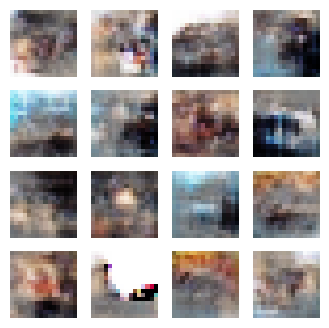

Epoch 164, Gen Loss: 1.3387293815612793, Disc Loss: 0.9882239103317261, Time: 6.503918886184692


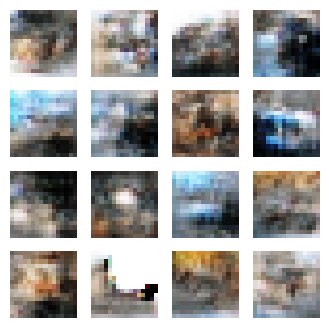

Epoch 165, Gen Loss: 1.3673232793807983, Disc Loss: 1.0529942512512207, Time: 6.47541356086731


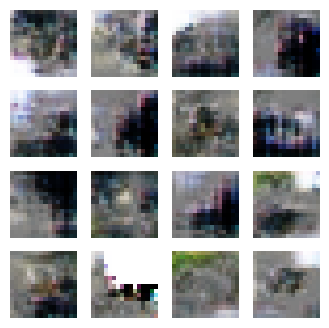

Epoch 166, Gen Loss: 3.0221855640411377, Disc Loss: 1.7525049448013306, Time: 6.525842666625977


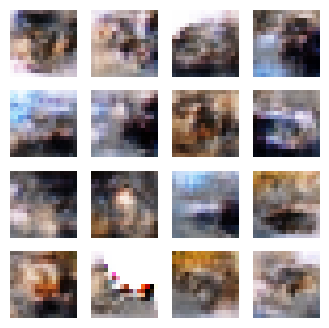

Epoch 167, Gen Loss: 1.9197783470153809, Disc Loss: 0.6762737035751343, Time: 6.738164901733398


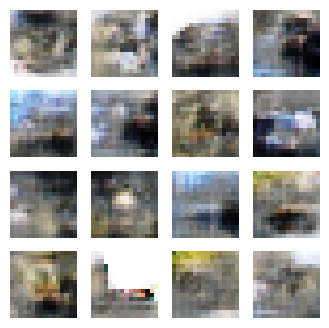

Epoch 168, Gen Loss: 1.6630860567092896, Disc Loss: 0.8564195036888123, Time: 6.598266839981079


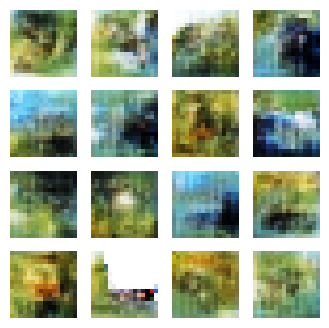

Epoch 169, Gen Loss: 4.003705978393555, Disc Loss: 0.47807422280311584, Time: 6.477336168289185


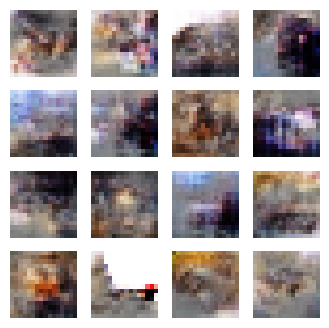

Epoch 170, Gen Loss: 1.8091336488723755, Disc Loss: 1.391431212425232, Time: 6.659964323043823


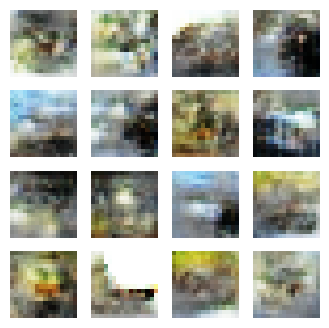

Epoch 171, Gen Loss: 1.9233063459396362, Disc Loss: 1.031020164489746, Time: 6.714483261108398


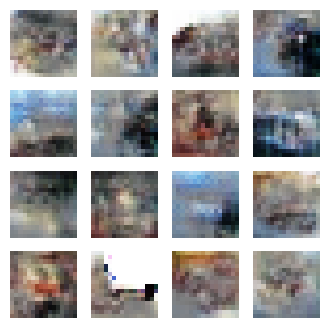

Epoch 172, Gen Loss: 1.5929627418518066, Disc Loss: 0.8307198286056519, Time: 6.466932535171509


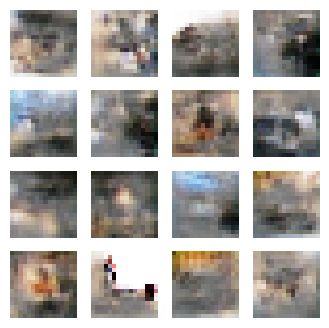

Epoch 173, Gen Loss: 1.27564537525177, Disc Loss: 1.5539164543151855, Time: 6.470222234725952


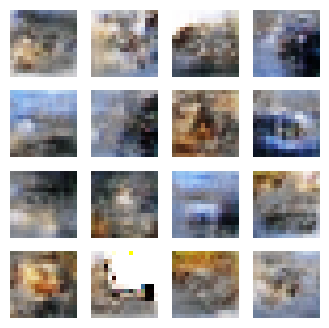

Epoch 174, Gen Loss: 1.6252946853637695, Disc Loss: 0.884075403213501, Time: 6.471827983856201


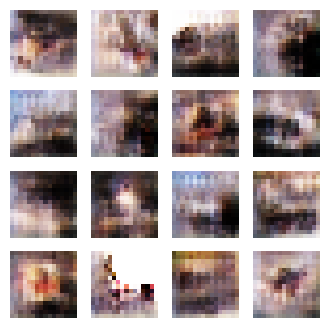

Epoch 175, Gen Loss: 2.627274513244629, Disc Loss: 0.4797911047935486, Time: 6.4646947383880615


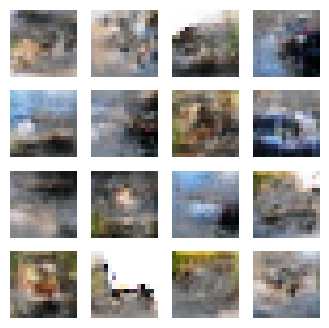

Epoch 176, Gen Loss: 1.3406178951263428, Disc Loss: 0.9905978441238403, Time: 6.777605772018433


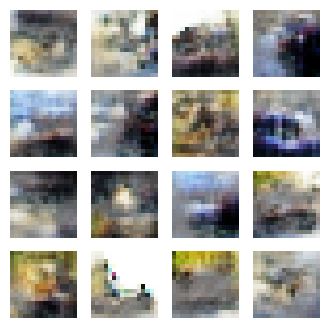

Epoch 177, Gen Loss: 2.483471155166626, Disc Loss: 0.5733559727668762, Time: 6.497680187225342


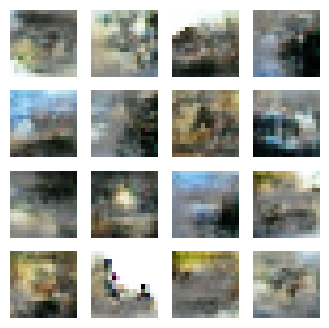

Epoch 178, Gen Loss: 1.5752124786376953, Disc Loss: 1.0056908130645752, Time: 6.517176151275635


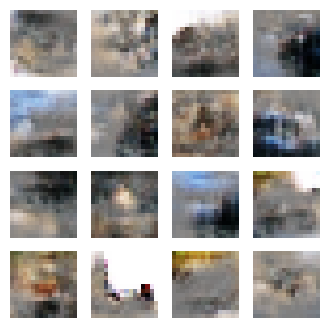

Epoch 179, Gen Loss: 2.7046852111816406, Disc Loss: 0.9556241035461426, Time: 6.497331857681274


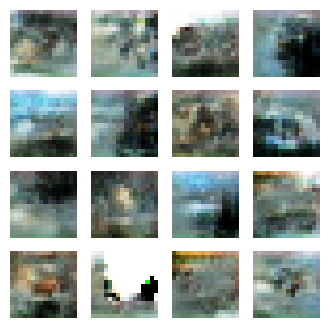

Epoch 180, Gen Loss: 0.9295862913131714, Disc Loss: 1.522688627243042, Time: 6.806092262268066


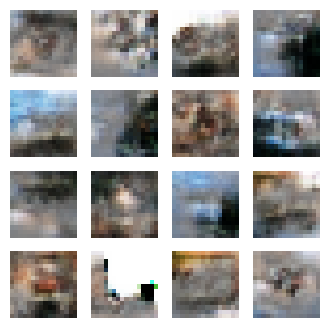

Epoch 181, Gen Loss: 0.9646989107131958, Disc Loss: 1.5372586250305176, Time: 6.594566106796265


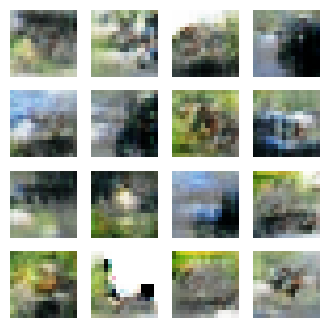

Epoch 182, Gen Loss: 3.5039830207824707, Disc Loss: 1.131425380706787, Time: 6.502066612243652


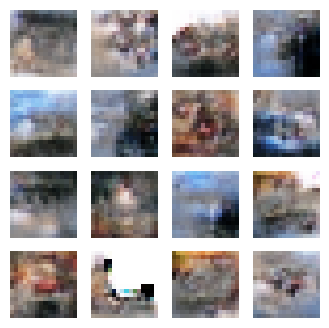

Epoch 183, Gen Loss: 1.6087738275527954, Disc Loss: 0.9902369379997253, Time: 6.613690376281738


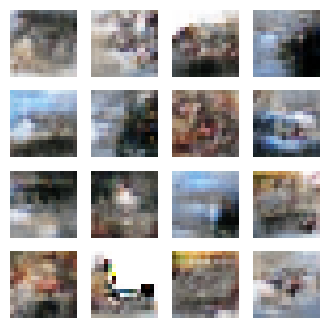

Epoch 184, Gen Loss: 1.5100922584533691, Disc Loss: 1.3721576929092407, Time: 6.506728887557983


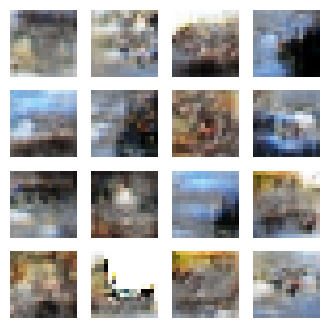

Epoch 185, Gen Loss: 1.5665128231048584, Disc Loss: 1.1084790229797363, Time: 7.01956582069397


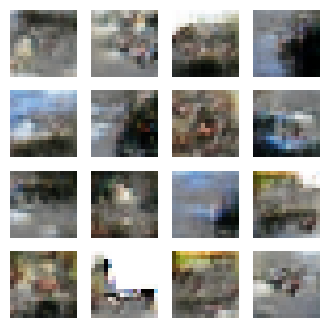

Epoch 186, Gen Loss: 2.1466050148010254, Disc Loss: 0.6971188187599182, Time: 6.477494239807129


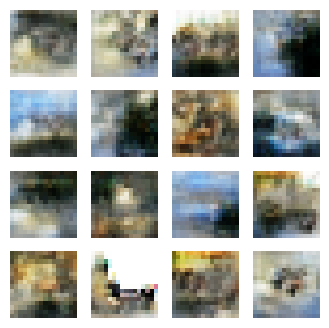

Epoch 187, Gen Loss: 1.8128812313079834, Disc Loss: 1.1536791324615479, Time: 6.505997180938721


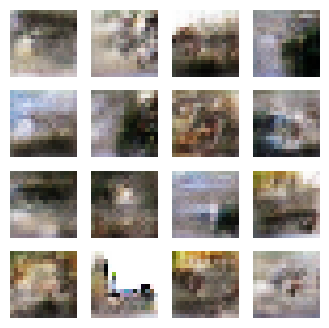

Epoch 188, Gen Loss: 1.4258570671081543, Disc Loss: 1.4227449893951416, Time: 6.4685914516448975


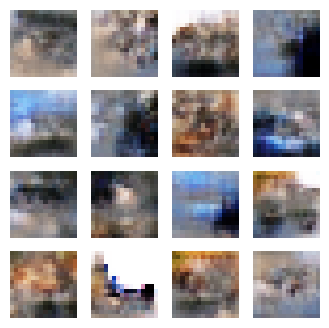

Epoch 189, Gen Loss: 1.4147788286209106, Disc Loss: 1.3764188289642334, Time: 6.783524751663208


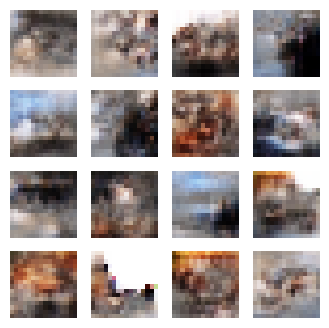

Epoch 190, Gen Loss: 1.9481239318847656, Disc Loss: 0.6585538387298584, Time: 6.487365007400513


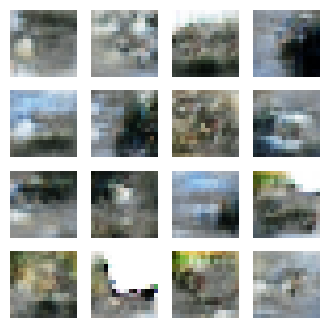

Epoch 191, Gen Loss: 0.9472392201423645, Disc Loss: 1.1177363395690918, Time: 6.4410789012908936


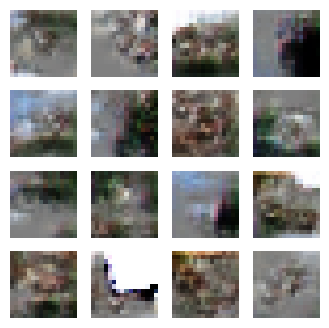

Epoch 192, Gen Loss: 2.3392438888549805, Disc Loss: 1.6486022472381592, Time: 6.481099605560303


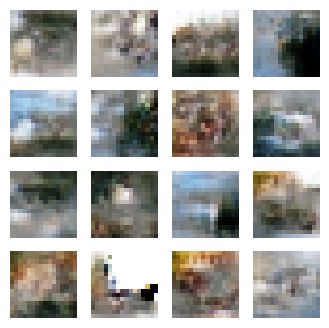

Epoch 193, Gen Loss: 1.5792105197906494, Disc Loss: 0.9365718960762024, Time: 6.762685537338257


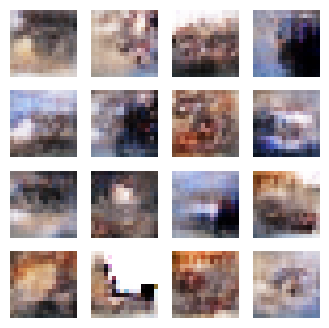

Epoch 194, Gen Loss: 1.8741075992584229, Disc Loss: 0.9507662057876587, Time: 6.476858139038086


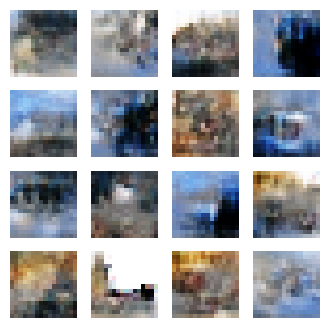

Epoch 195, Gen Loss: 1.4389358758926392, Disc Loss: 1.047964096069336, Time: 6.563197135925293


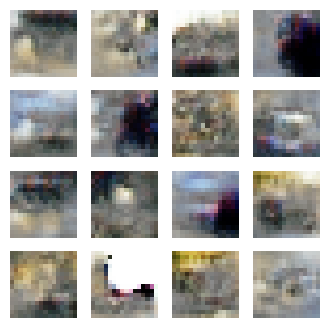

Epoch 196, Gen Loss: 1.3080217838287354, Disc Loss: 1.3911458253860474, Time: 6.661616086959839


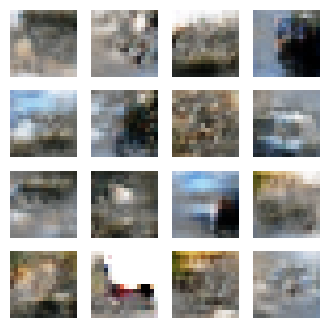

Epoch 197, Gen Loss: 1.3150346279144287, Disc Loss: 0.9260539412498474, Time: 6.513888359069824


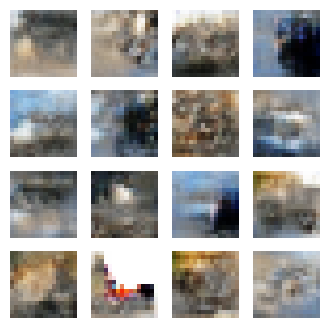

Epoch 198, Gen Loss: 1.8571264743804932, Disc Loss: 0.7737182974815369, Time: 7.033923625946045


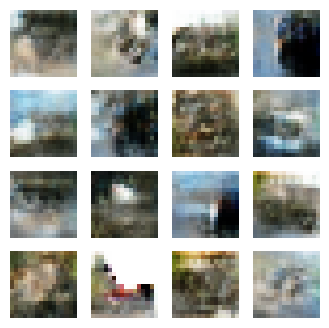

Epoch 199, Gen Loss: 2.0353918075561523, Disc Loss: 0.8784458041191101, Time: 6.529381513595581


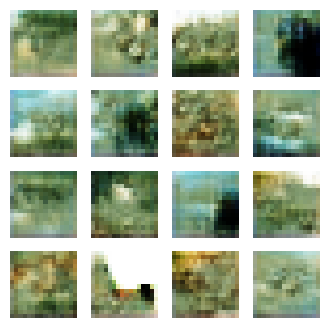

Epoch 200, Gen Loss: 2.1077725887298584, Disc Loss: 0.8287789821624756, Time: 6.529508590698242


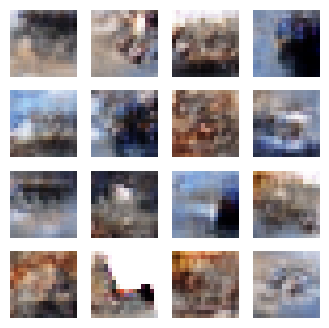

Epoch 201, Gen Loss: 1.719999074935913, Disc Loss: 0.9284347295761108, Time: 6.442161321640015


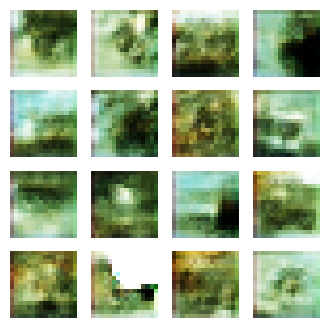

Epoch 202, Gen Loss: 2.8766441345214844, Disc Loss: 0.5038406848907471, Time: 6.789266347885132


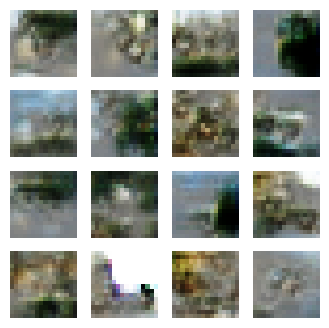

Epoch 203, Gen Loss: 2.1952946186065674, Disc Loss: 0.5264179706573486, Time: 6.481363534927368


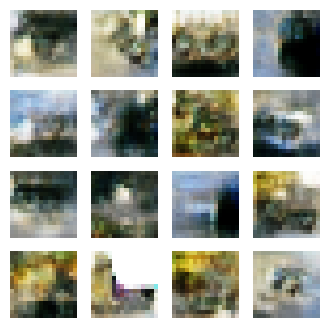

Epoch 204, Gen Loss: 1.6564810276031494, Disc Loss: 0.9336044788360596, Time: 6.476076602935791


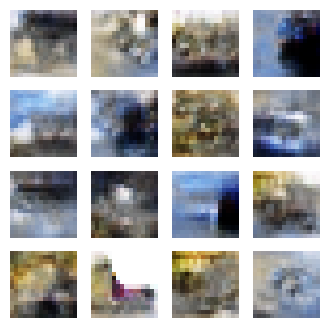

Epoch 205, Gen Loss: 1.2487385272979736, Disc Loss: 0.97788405418396, Time: 6.478994369506836


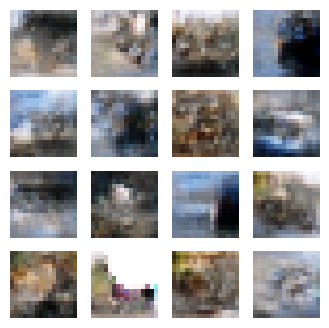

Epoch 206, Gen Loss: 1.2657544612884521, Disc Loss: 1.0940877199172974, Time: 6.502205848693848


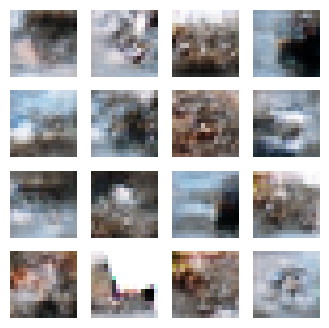

Epoch 207, Gen Loss: 1.4790501594543457, Disc Loss: 0.93375563621521, Time: 6.779329538345337


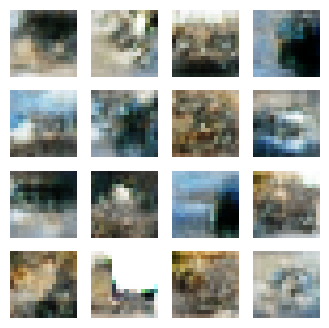

Epoch 208, Gen Loss: 1.5047087669372559, Disc Loss: 0.9441882371902466, Time: 6.505292892456055


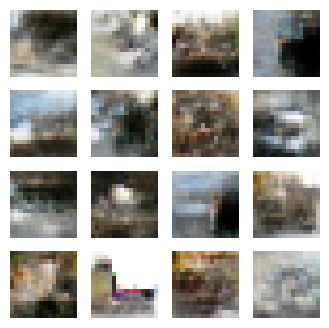

Epoch 209, Gen Loss: 1.7737224102020264, Disc Loss: 0.9119976758956909, Time: 6.634638547897339


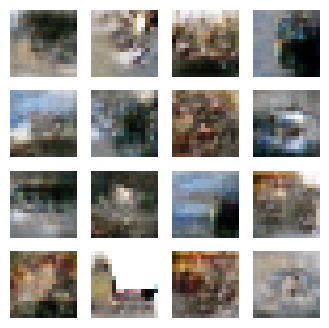

Epoch 210, Gen Loss: 1.551443099975586, Disc Loss: 1.0906633138656616, Time: 6.5178751945495605


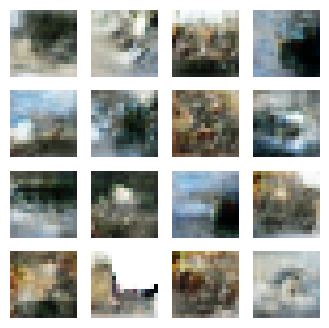

Epoch 211, Gen Loss: 1.4967198371887207, Disc Loss: 0.9402382373809814, Time: 6.901862621307373


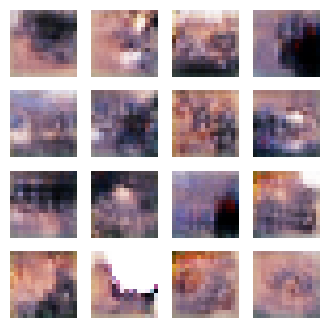

Epoch 212, Gen Loss: 1.5206822156906128, Disc Loss: 1.175559401512146, Time: 6.536048412322998


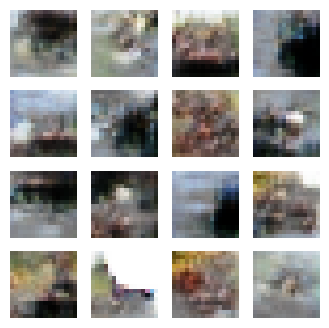

Epoch 213, Gen Loss: 1.506595492362976, Disc Loss: 1.2947771549224854, Time: 6.652719259262085


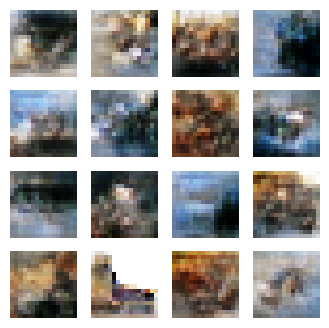

Epoch 214, Gen Loss: 1.5676536560058594, Disc Loss: 1.0586459636688232, Time: 6.528250455856323


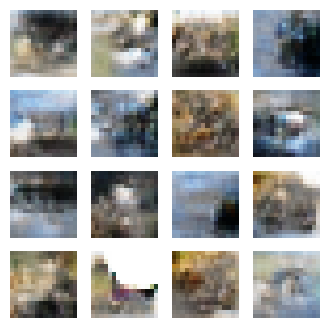

Epoch 215, Gen Loss: 1.4758689403533936, Disc Loss: 1.057199239730835, Time: 6.776820421218872


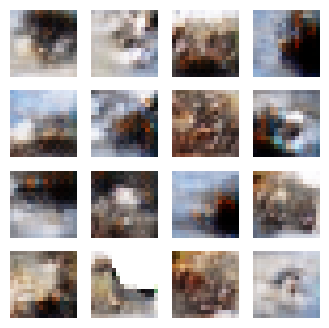

Epoch 216, Gen Loss: 2.574167490005493, Disc Loss: 0.5648641586303711, Time: 6.50460147857666


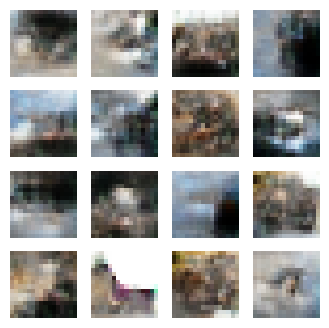

Epoch 217, Gen Loss: 2.0600948333740234, Disc Loss: 1.4064531326293945, Time: 6.482478380203247


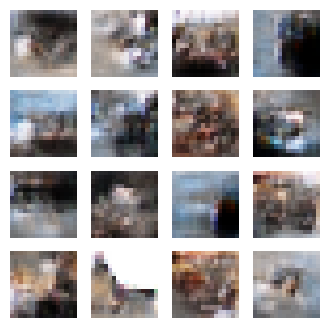

Epoch 218, Gen Loss: 1.1919384002685547, Disc Loss: 1.44480299949646, Time: 6.481013774871826


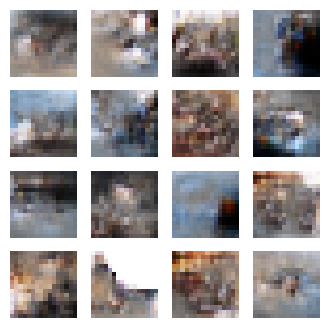

Epoch 219, Gen Loss: 1.4235191345214844, Disc Loss: 0.8728686571121216, Time: 6.508111238479614


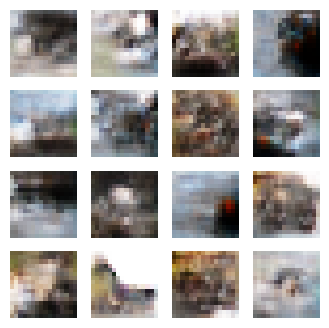

Epoch 220, Gen Loss: 1.9579838514328003, Disc Loss: 0.8052182197570801, Time: 6.776390314102173


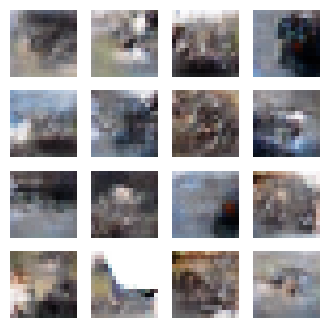

Epoch 221, Gen Loss: 2.6524181365966797, Disc Loss: 0.8171660304069519, Time: 6.4685657024383545


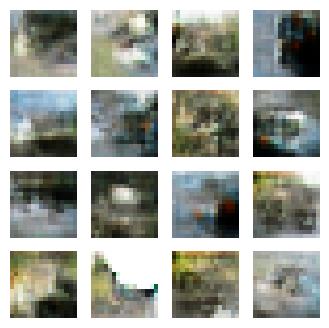

Epoch 222, Gen Loss: 1.713226556777954, Disc Loss: 0.9018923044204712, Time: 6.462475776672363


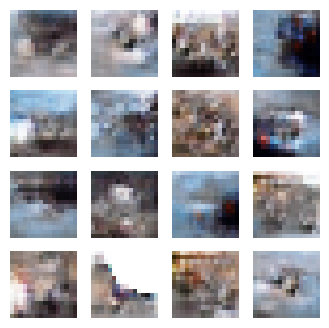

Epoch 223, Gen Loss: 0.8583788871765137, Disc Loss: 1.6650919914245605, Time: 6.520396709442139


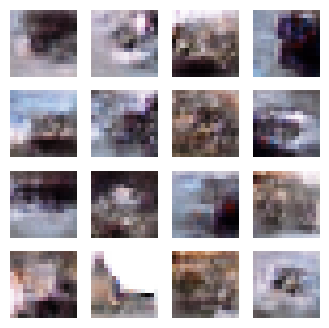

Epoch 224, Gen Loss: 1.2438814640045166, Disc Loss: 1.2729582786560059, Time: 6.984835147857666


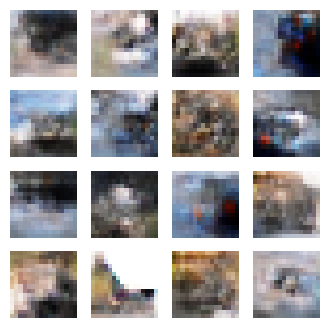

Epoch 225, Gen Loss: 1.2491096258163452, Disc Loss: 1.2187966108322144, Time: 6.556600332260132


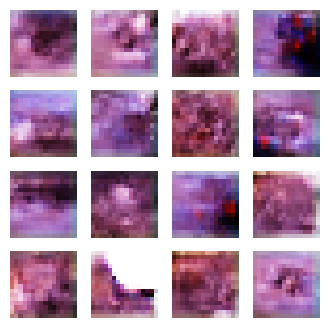

Epoch 226, Gen Loss: 7.59586238861084, Disc Loss: 0.1819952130317688, Time: 6.613558053970337


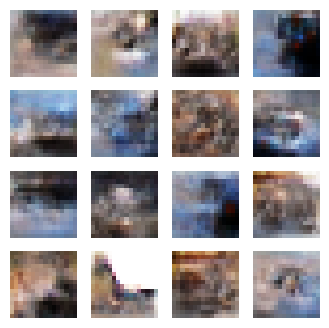

Epoch 227, Gen Loss: 0.7953641414642334, Disc Loss: 1.7704074382781982, Time: 6.561347246170044


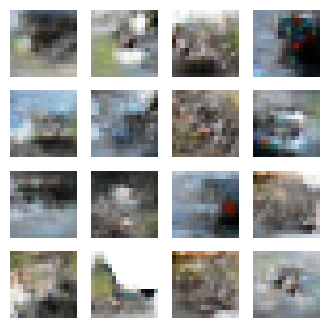

Epoch 228, Gen Loss: 1.1524662971496582, Disc Loss: 1.0703505277633667, Time: 6.648239374160767


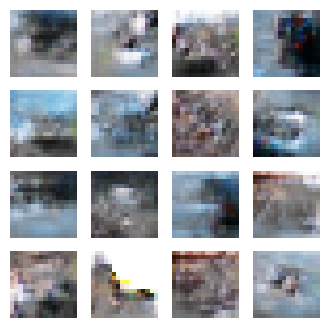

Epoch 229, Gen Loss: 1.7319726943969727, Disc Loss: 0.863216757774353, Time: 6.827080249786377


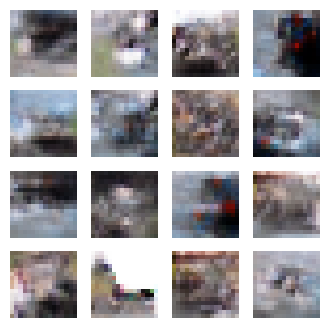

Epoch 230, Gen Loss: 1.9780690670013428, Disc Loss: 0.9574481844902039, Time: 6.5031046867370605


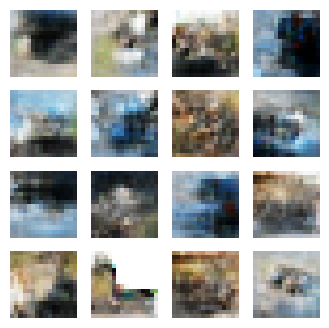

Epoch 231, Gen Loss: 1.3429443836212158, Disc Loss: 1.158980131149292, Time: 6.4563446044921875


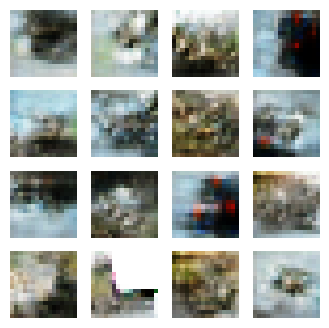

Epoch 232, Gen Loss: 1.1568537950515747, Disc Loss: 1.0544952154159546, Time: 6.501405954360962


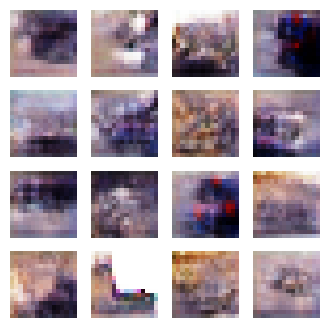

Epoch 233, Gen Loss: 0.982895016670227, Disc Loss: 1.0988988876342773, Time: 6.78061580657959


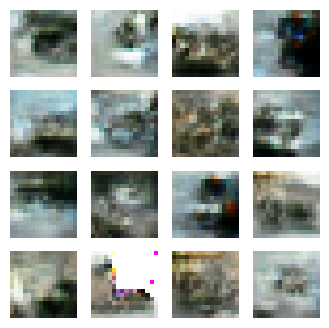

Epoch 234, Gen Loss: 1.1784188747406006, Disc Loss: 1.0507595539093018, Time: 6.496519327163696


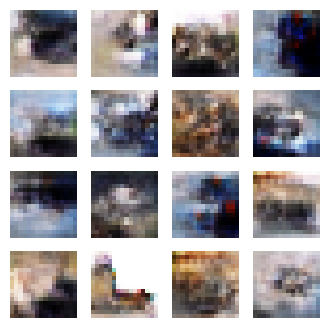

Epoch 235, Gen Loss: 1.5226964950561523, Disc Loss: 0.9105085134506226, Time: 6.515818119049072


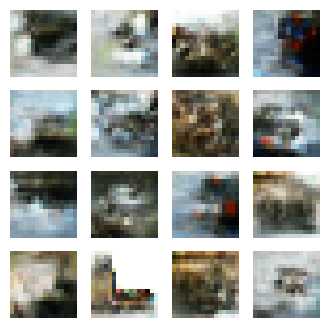

Epoch 236, Gen Loss: 1.673083782196045, Disc Loss: 0.758046567440033, Time: 6.495163440704346


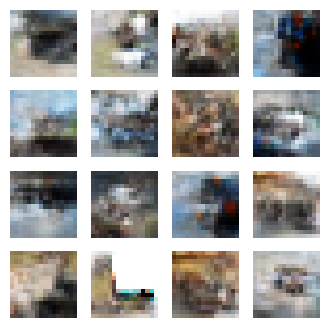

Epoch 237, Gen Loss: 1.417647361755371, Disc Loss: 1.1544952392578125, Time: 6.523629665374756


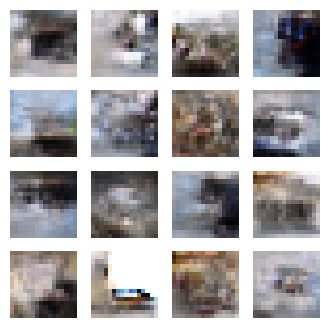

Epoch 238, Gen Loss: 1.325972080230713, Disc Loss: 1.0613104104995728, Time: 6.81601095199585


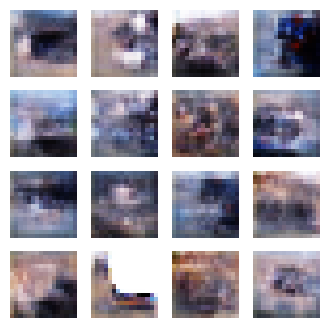

Epoch 239, Gen Loss: 1.9329218864440918, Disc Loss: 0.6884225606918335, Time: 6.618577003479004


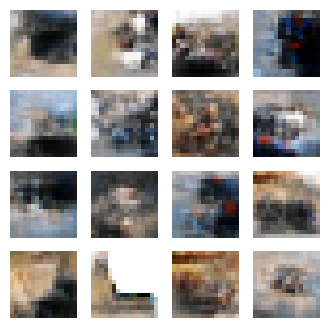

Epoch 240, Gen Loss: 1.3997688293457031, Disc Loss: 0.821190357208252, Time: 6.556158781051636


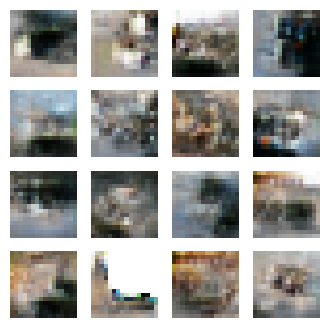

Epoch 241, Gen Loss: 1.1537164449691772, Disc Loss: 1.1575922966003418, Time: 6.606194496154785


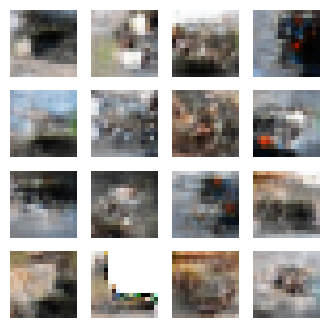

Epoch 242, Gen Loss: 1.8046767711639404, Disc Loss: 0.7249526977539062, Time: 6.808650255203247


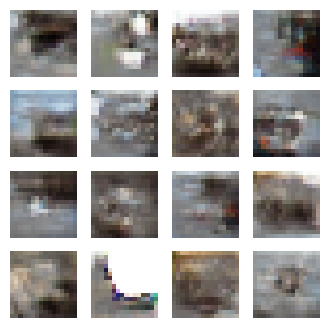

Epoch 243, Gen Loss: 2.035916328430176, Disc Loss: 0.834121584892273, Time: 6.509467601776123


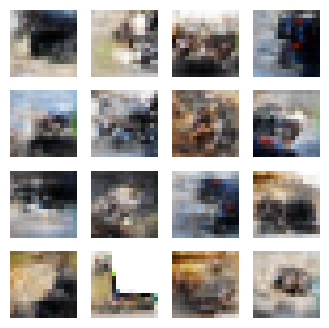

Epoch 244, Gen Loss: 1.6232306957244873, Disc Loss: 1.0358457565307617, Time: 6.5123515129089355


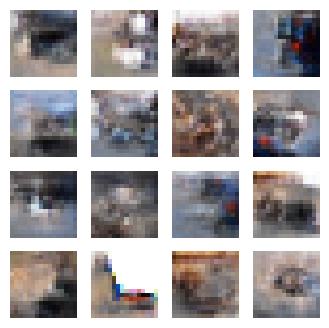

Epoch 245, Gen Loss: 1.2757173776626587, Disc Loss: 1.156390905380249, Time: 6.515336990356445


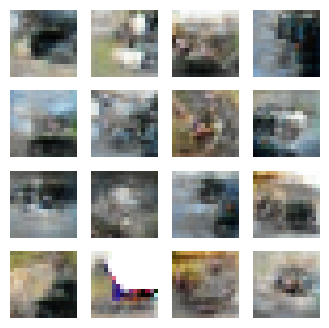

Epoch 246, Gen Loss: 1.257799744606018, Disc Loss: 1.2741906642913818, Time: 6.724003076553345


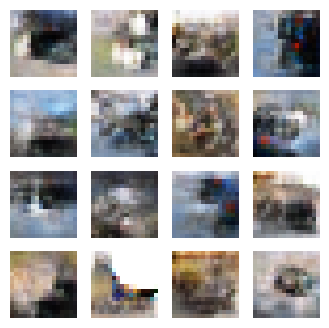

Epoch 247, Gen Loss: 1.469067931175232, Disc Loss: 1.0629537105560303, Time: 6.510453939437866


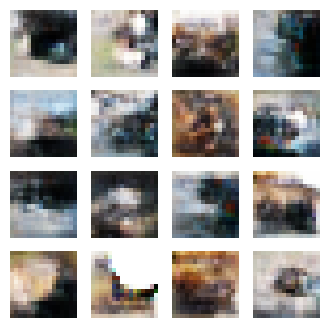

Epoch 248, Gen Loss: 1.8537287712097168, Disc Loss: 0.8926173448562622, Time: 6.48205304145813


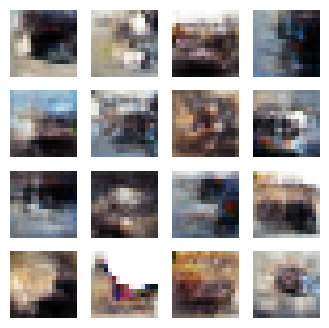

Epoch 249, Gen Loss: 1.3040986061096191, Disc Loss: 1.4944024085998535, Time: 6.485663890838623


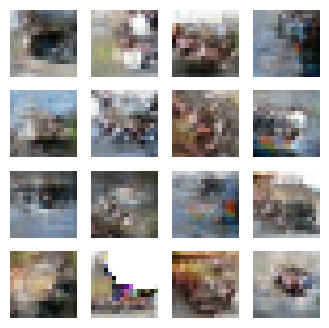

Epoch 250, Gen Loss: 0.6354057788848877, Disc Loss: 1.4570077657699585, Time: 6.4901299476623535


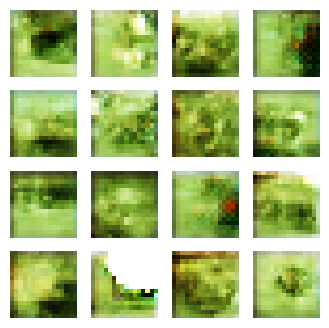

Epoch 251, Gen Loss: 4.728126525878906, Disc Loss: 0.2628411054611206, Time: 6.751680374145508


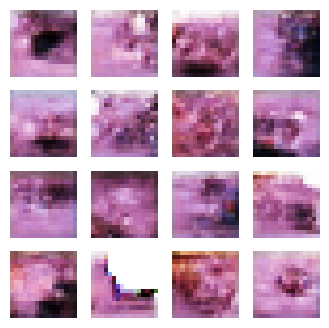

Epoch 252, Gen Loss: 6.688328742980957, Disc Loss: 0.2209581583738327, Time: 6.683431386947632


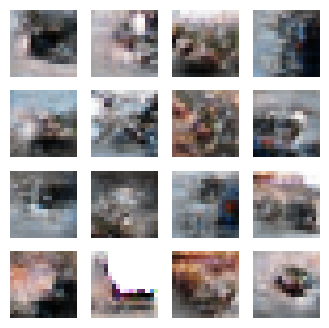

Epoch 253, Gen Loss: 1.5920414924621582, Disc Loss: 0.836552619934082, Time: 6.507444381713867


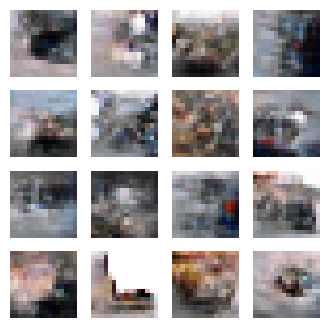

Epoch 254, Gen Loss: 1.2102434635162354, Disc Loss: 0.9892457723617554, Time: 6.587768793106079


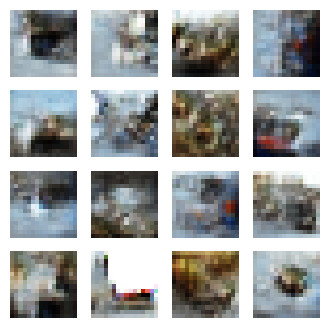

Epoch 255, Gen Loss: 1.260786771774292, Disc Loss: 1.2171635627746582, Time: 6.786516427993774


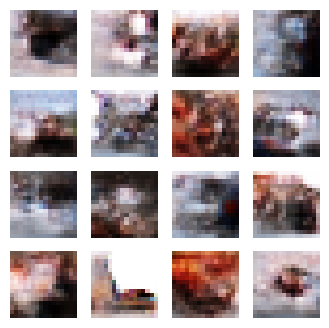

Epoch 256, Gen Loss: 2.293961524963379, Disc Loss: 1.4082965850830078, Time: 6.6786558628082275


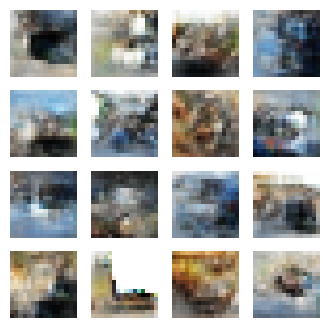

Epoch 257, Gen Loss: 1.3919055461883545, Disc Loss: 1.125144362449646, Time: 6.488894939422607


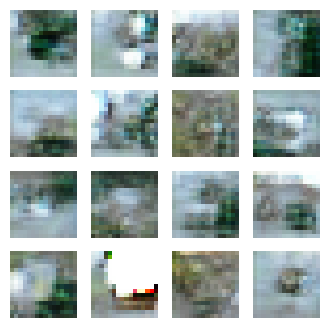

Epoch 258, Gen Loss: 1.5345035791397095, Disc Loss: 1.1481496095657349, Time: 6.511704206466675


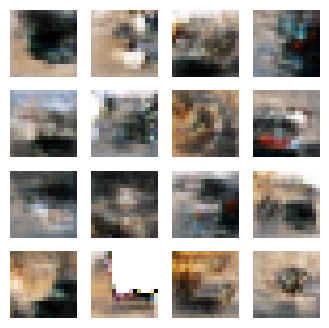

Epoch 259, Gen Loss: 1.7163569927215576, Disc Loss: 1.0252634286880493, Time: 6.475774765014648


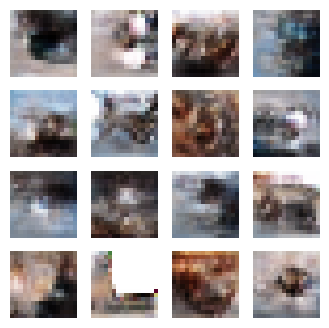

Epoch 260, Gen Loss: 1.6189666986465454, Disc Loss: 1.266750693321228, Time: 6.776697397232056


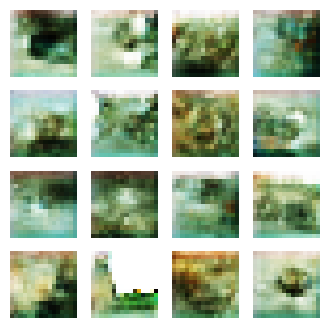

Epoch 261, Gen Loss: 2.308856964111328, Disc Loss: 0.8141219615936279, Time: 6.4537739753723145


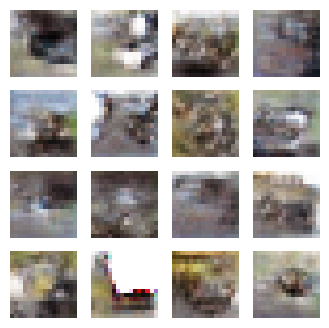

Epoch 262, Gen Loss: 0.6147898435592651, Disc Loss: 2.0140902996063232, Time: 6.49656343460083


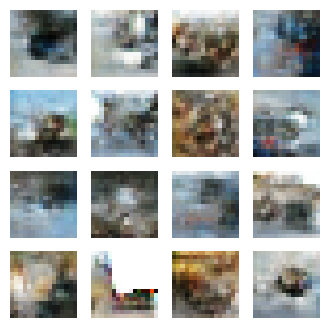

Epoch 263, Gen Loss: 1.447441577911377, Disc Loss: 1.120704174041748, Time: 6.5395588874816895


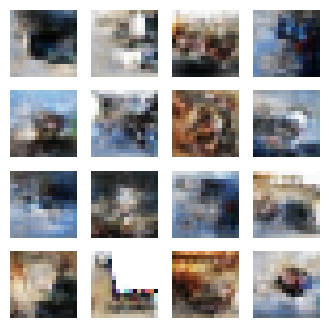

Epoch 264, Gen Loss: 1.207969069480896, Disc Loss: 1.251537561416626, Time: 6.772322177886963


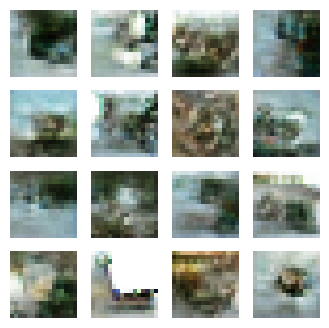

Epoch 265, Gen Loss: 0.9823944568634033, Disc Loss: 1.2750142812728882, Time: 6.497835636138916


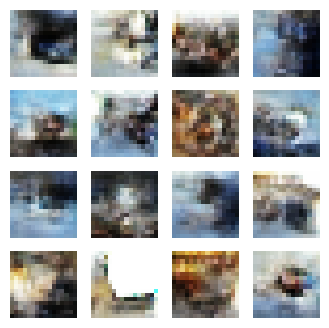

Epoch 266, Gen Loss: 1.2637312412261963, Disc Loss: 1.4328033924102783, Time: 6.4935173988342285


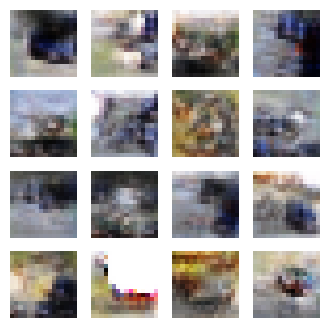

Epoch 267, Gen Loss: 1.294263243675232, Disc Loss: 1.0365244150161743, Time: 6.650965929031372


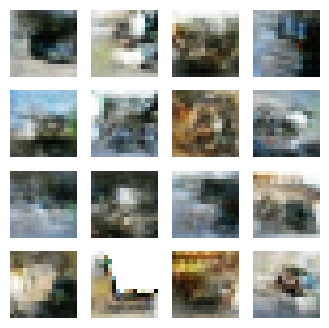

Epoch 268, Gen Loss: 1.1139190196990967, Disc Loss: 1.2440673112869263, Time: 6.801183700561523


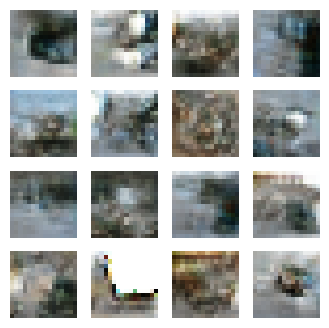

Epoch 269, Gen Loss: 0.9136281609535217, Disc Loss: 1.5879360437393188, Time: 6.692947626113892


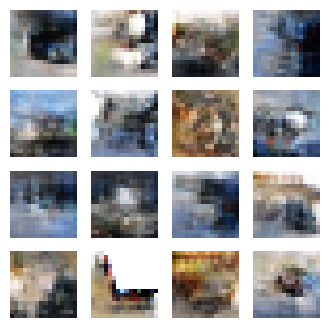

Epoch 270, Gen Loss: 1.0971007347106934, Disc Loss: 1.1426949501037598, Time: 6.5213704109191895


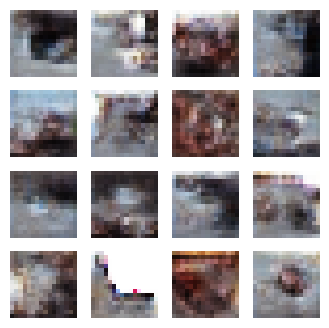

Epoch 271, Gen Loss: 1.741027593612671, Disc Loss: 1.169342041015625, Time: 6.5498316287994385


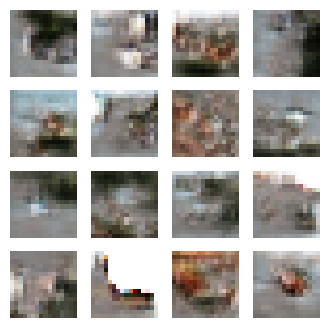

Epoch 272, Gen Loss: 1.5190445184707642, Disc Loss: 0.9029857516288757, Time: 6.47122859954834


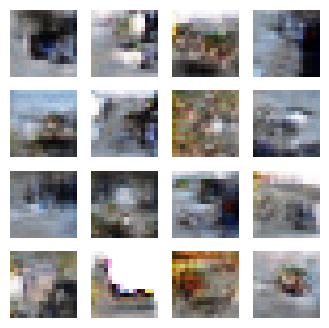

Epoch 273, Gen Loss: 1.0430355072021484, Disc Loss: 1.211099624633789, Time: 6.814098358154297


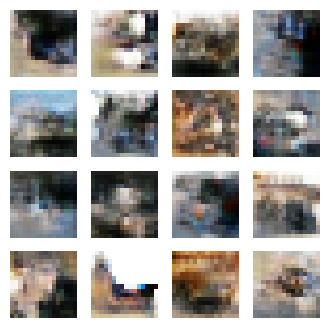

Epoch 274, Gen Loss: 1.288461685180664, Disc Loss: 1.4715399742126465, Time: 6.510889768600464


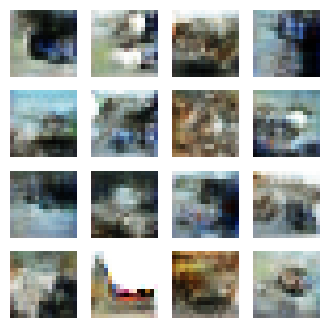

Epoch 275, Gen Loss: 1.5058389902114868, Disc Loss: 0.8649042844772339, Time: 6.520329236984253


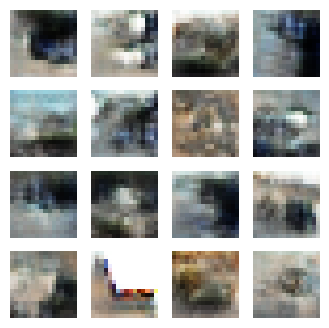

Epoch 276, Gen Loss: 1.6011121273040771, Disc Loss: 1.808886170387268, Time: 6.528977632522583


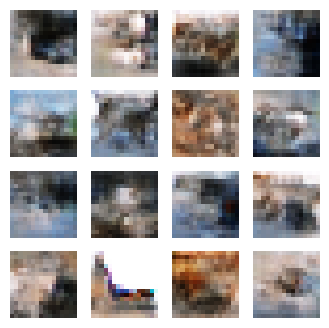

Epoch 277, Gen Loss: 1.166491985321045, Disc Loss: 1.3172581195831299, Time: 6.765716314315796


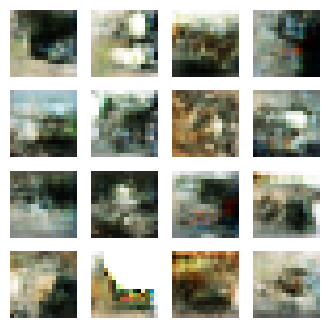

Epoch 278, Gen Loss: 1.221158504486084, Disc Loss: 1.1798450946807861, Time: 6.512882947921753


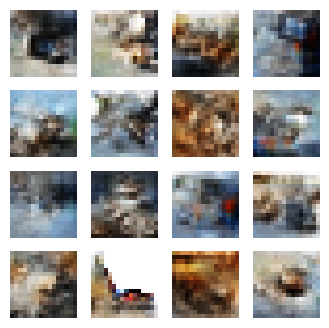

Epoch 279, Gen Loss: 1.2299315929412842, Disc Loss: 1.1353960037231445, Time: 6.562166213989258


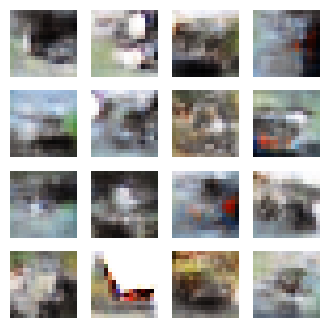

Epoch 280, Gen Loss: 1.2803620100021362, Disc Loss: 1.1395461559295654, Time: 6.613077163696289


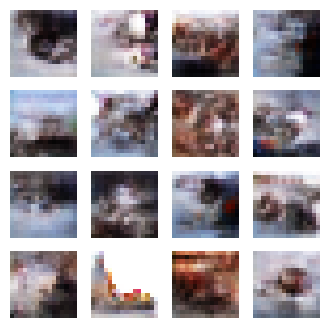

Epoch 281, Gen Loss: 0.8762290477752686, Disc Loss: 1.8704047203063965, Time: 6.468360424041748


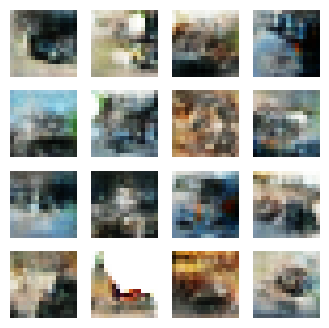

Epoch 282, Gen Loss: 1.7521833181381226, Disc Loss: 0.9712004065513611, Time: 6.977009057998657


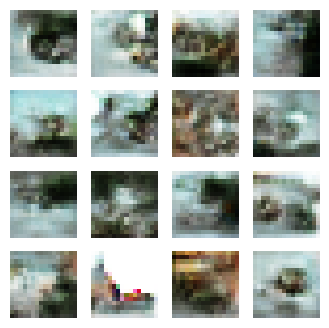

Epoch 283, Gen Loss: 1.2155194282531738, Disc Loss: 0.9911428689956665, Time: 6.52436089515686


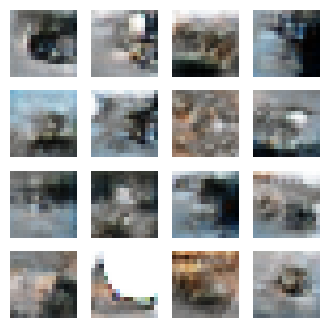

Epoch 284, Gen Loss: 1.3457741737365723, Disc Loss: 0.925026535987854, Time: 6.6689043045043945


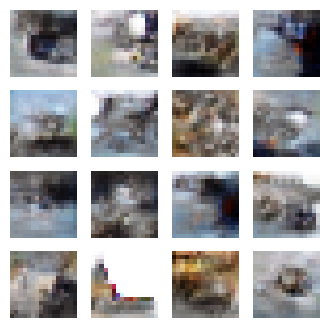

Epoch 285, Gen Loss: 1.2609812021255493, Disc Loss: 1.0232360363006592, Time: 6.517029523849487


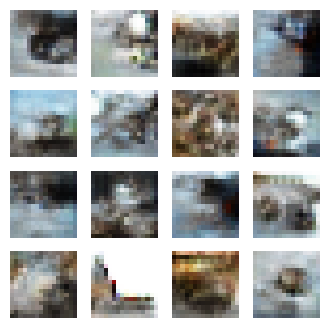

Epoch 286, Gen Loss: 1.140233039855957, Disc Loss: 1.2937140464782715, Time: 6.766853332519531


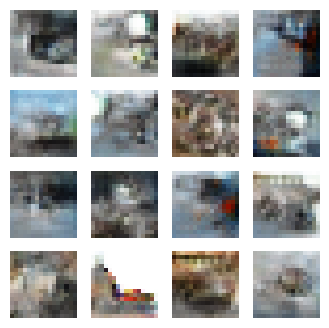

Epoch 287, Gen Loss: 1.035584568977356, Disc Loss: 1.2842228412628174, Time: 6.513417720794678


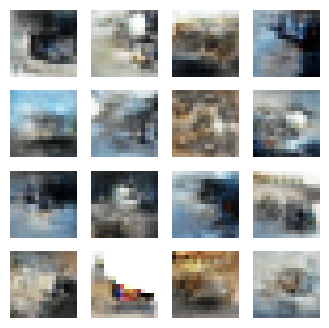

Epoch 288, Gen Loss: 1.5986969470977783, Disc Loss: 1.4851794242858887, Time: 6.499357223510742


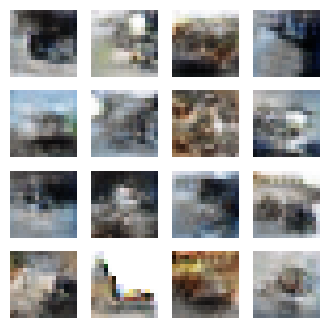

Epoch 289, Gen Loss: 1.3267896175384521, Disc Loss: 1.3123631477355957, Time: 6.470707654953003


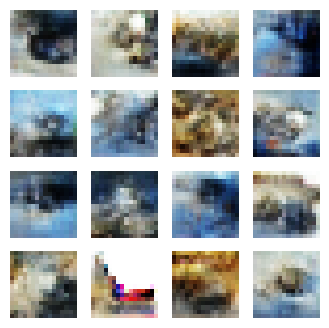

Epoch 290, Gen Loss: 1.8923451900482178, Disc Loss: 1.1680350303649902, Time: 6.535494565963745


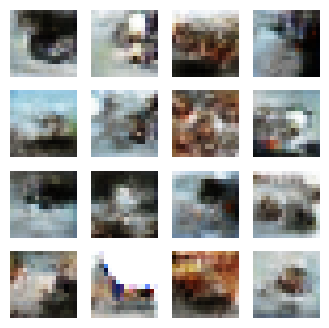

Epoch 291, Gen Loss: 1.2944259643554688, Disc Loss: 1.1653649806976318, Time: 6.709351062774658


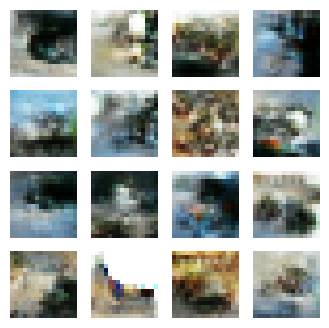

Epoch 292, Gen Loss: 0.908078670501709, Disc Loss: 1.1217403411865234, Time: 6.5106847286224365


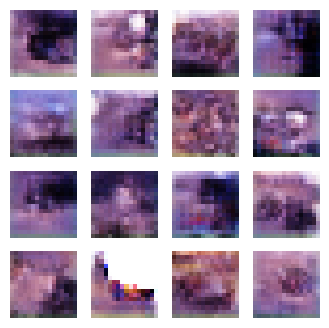

Epoch 293, Gen Loss: 3.0370945930480957, Disc Loss: 0.5277879238128662, Time: 6.495898246765137


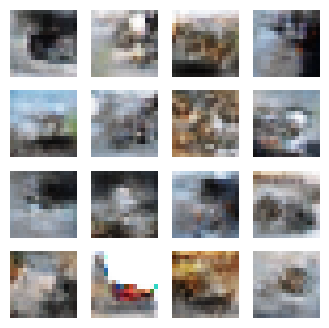

Epoch 294, Gen Loss: 0.9747194051742554, Disc Loss: 1.1289443969726562, Time: 6.502665996551514


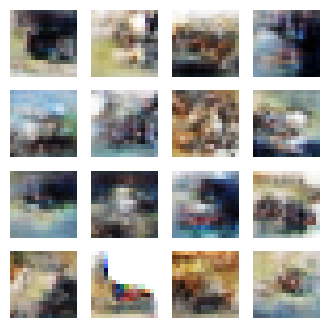

Epoch 295, Gen Loss: 1.1316369771957397, Disc Loss: 1.1774415969848633, Time: 7.041226863861084


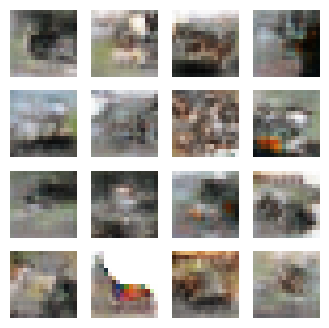

Epoch 296, Gen Loss: 0.8257220983505249, Disc Loss: 1.220386028289795, Time: 6.489210605621338


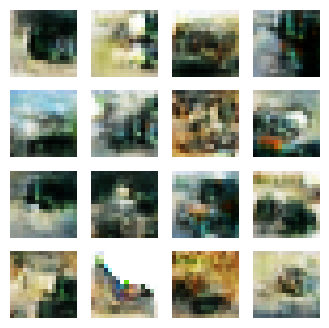

Epoch 297, Gen Loss: 2.1236047744750977, Disc Loss: 1.0426599979400635, Time: 6.698678970336914


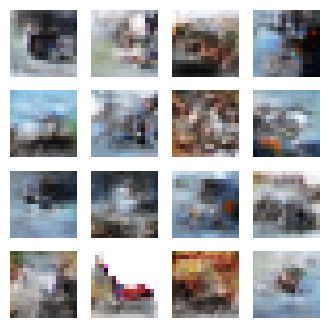

Epoch 298, Gen Loss: 1.209576964378357, Disc Loss: 1.4599089622497559, Time: 6.5100998878479


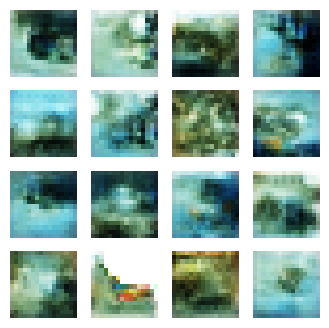

Epoch 299, Gen Loss: 1.065356969833374, Disc Loss: 2.2988088130950928, Time: 7.014033317565918


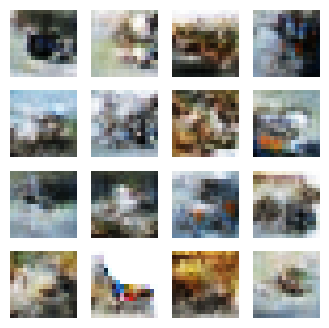

Epoch 300, Gen Loss: 1.1498279571533203, Disc Loss: 1.3942885398864746, Time: 6.496472358703613


In [9]:
train(train_dataset, EPOCHS)


In [ ]:
# 생성자 모델 저장
generator.save(f"{base_dir}/generator_model.h5")
print("Generator model saved.")


<ipython-input-10-ae2a5afe08d1>:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(filename))


GIF saved at: /content/dcgan_lowres_cifar10/training_history/progress.gif


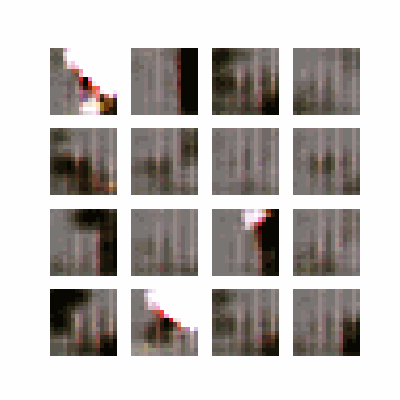

In [10]:
# GIF 생성
def create_gif(image_folder, gif_path):
    images = []
    for filename in sorted(glob.glob(f"{image_folder}/*.png")):
        images.append(imageio.imread(filename))
    imageio.mimsave(gif_path, images, fps=5)

# GIF 저장
gif_path = f"{base_dir}/training_history/progress.gif"
create_gif(f"{base_dir}/generated_samples", gif_path)
print("GIF saved at:", gif_path)

# 마지막 이미지 확인
from IPython.display import Image, display
display(Image(gif_path))
